# 24-1. Project: 모델 바꿔보기
라이브러리 버전 확인
프로젝트에 사용할 주요 라이브러리 버전을 확인해봅니다.






In [48]:
import tensorflow as tf
import numpy as np
import PIL
import ray
from tensorflow.keras.backend import clear_session
import pandas as pd

print(tf.__version__)
print(np.__version__)
print(PIL.__version__)
print(ray.__version__)

2.6.0
1.21.4
8.3.2
1.7.0



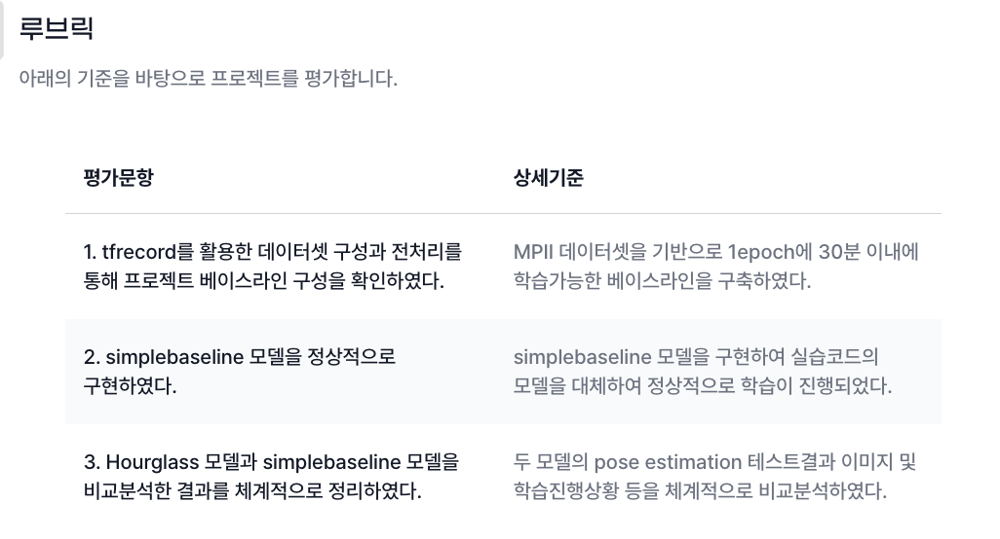

## STEP 1 : simplebaseline 모델 완성하기  
simplebaseline.py 파일과 이전에 살펴본 Simplebaseline 내용(22-6장)을 참고하여 모델을 완성합니다.

In [39]:
import tensorflow as tf

def _make_deconv_layer(num_deconv_layers):
    seq_model = tf.keras.models.Sequential()
    # seq_model: TensorFlow/Keras의 Sequential 모델로, 레이어를 순차적으로 쌓아나가는 방식으로 설계
    for i in range(num_deconv_layers):
        seq_model.add(tf.keras.layers.Conv2DTranspose(256, kernel_size=(4,4), strides=(2,2), padding='same'))
        seq_model.add(tf.keras.layers.BatchNormalization())
        seq_model.add(tf.keras.layers.ReLU())
    return seq_model

# Simplebaseline 함수 수정
def Simplebaseline(input_shape=(256, 256, 3)):
    resnet = tf.keras.applications.resnet.ResNet50(include_top=False, weights='imagenet')
    inputs = tf.keras.Input(shape=input_shape)
    upconv = _make_deconv_layer(3)
    final_layer = tf.keras.layers.Conv2D(16, kernel_size=(1,1), padding='same')

    inputs = tf.keras.Input(shape=input_shape)
    x = resnet(inputs)  # ResNet backbone
    x = upconv(x)  # Deconvolution layers
    out = final_layer(x)  # Final output layer
    model = tf.keras.Model(inputs, out, name='simple_baseline')
    
    return model


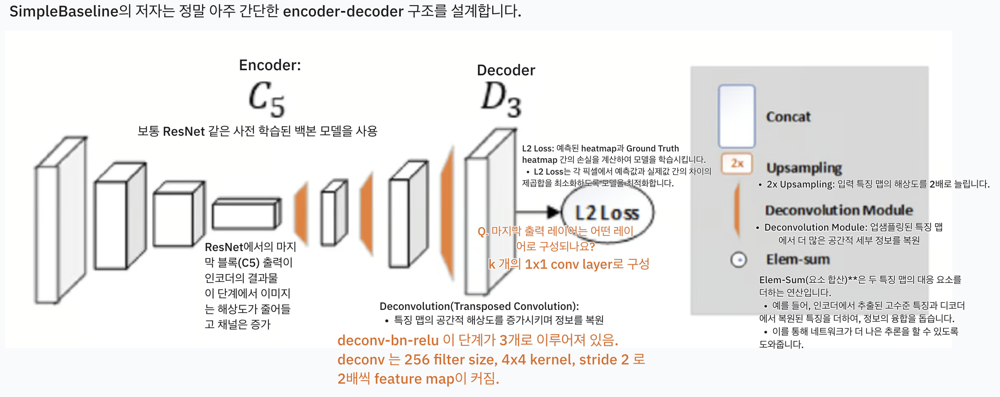

## 디버깅 2차
- 일차적으로, def Simplebaseline 밖에 resnet 모델을 선언한 뒤, 하단 simplebaseline 모델의 학습을 진행하고자 하였으나 훈련이 제대로 실행되지 않음.
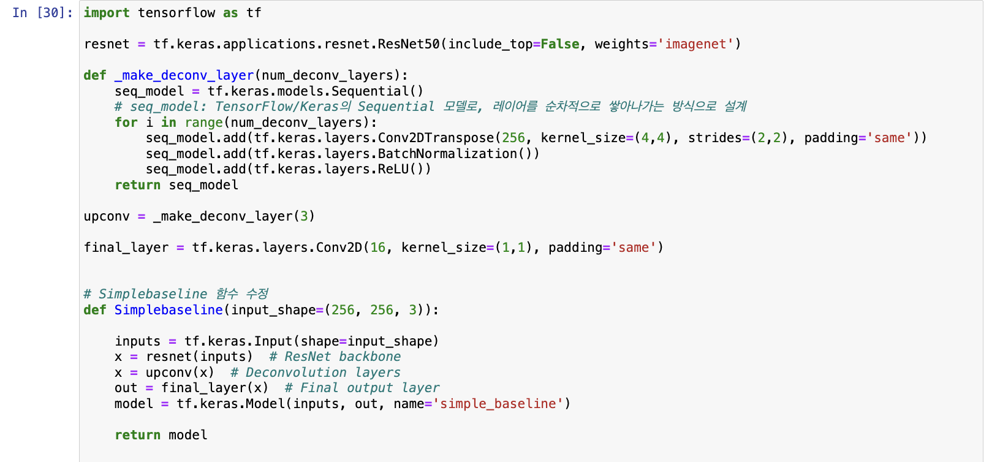


- def Simplebaseline 내부에 resnet 모델 넣으니 해결  
=> 이유는?   
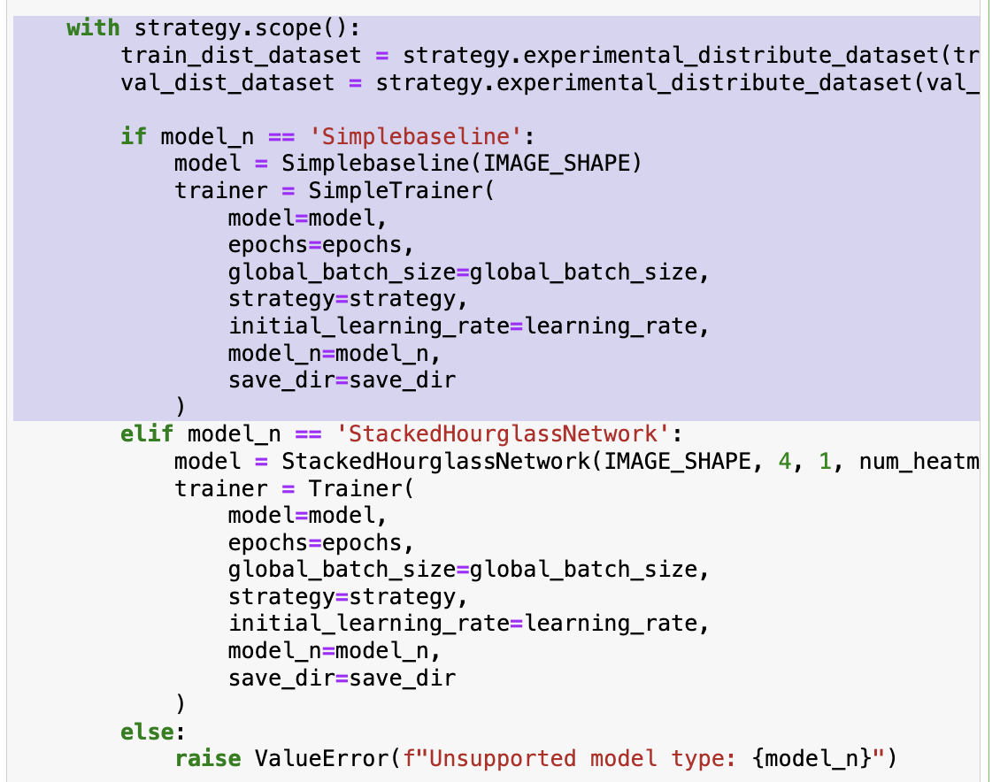
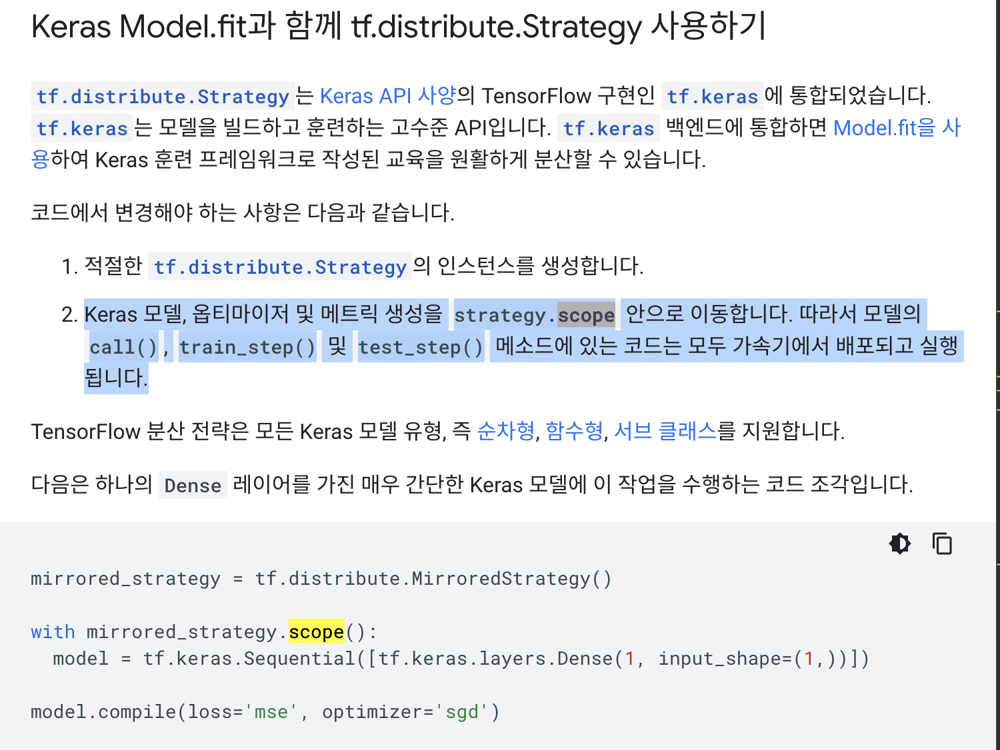
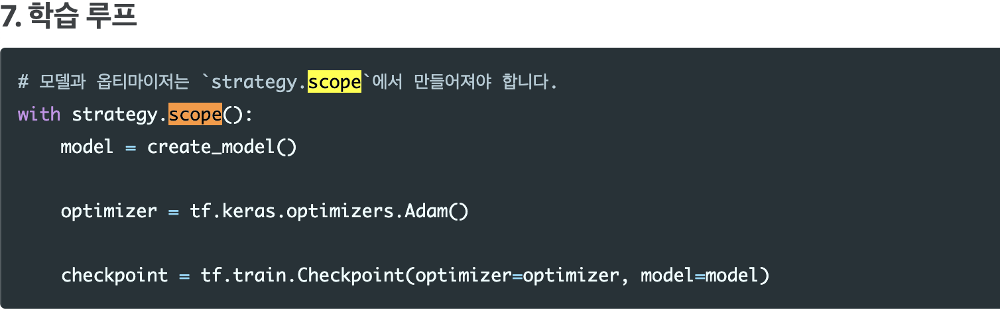


- tf.keras.applications.resnet.ResNet50 모델을 함수 외부에서 정의하고, 이를 Simplebaseline 함수 내부에서 사용하려고 할 때 문제가 발생하는 이유는 TensorFlow의 그래프 관리 및 변수 스코프와 관련
- renet50을 함수 밖에서 선언시, 위 객체는 독립적인 컨텍스트(환경)을 갖게 됨
- strategy.scope()의 분산전략에서는 서로 다른 그래프 컨텍스트(환경)을 섞는 걸 금지함 -> resnet rorcpsms scope()가 설정되기 전에 생성되기 때문에, 컨텍스트 충돌로 학습이 실패할 가능성이 높다고 함.
- 만약 def simplebaseline내부에 resnet50을 정의할 시, resnet50 모델도 strategy.scope() 안에서 선언되는 simplebaseline에 의해 분산 학습 환경에서 함께 생성됨. => 충돌이 생기지 않고 정상적인 학습이 가능

## STEP 2 : simplebaseline 모델로 변경하여 훈련하기  
StackedHourglass를 학습시킨 코드의 모델 선언 부분을 simplebaseline 모델로 변경한 후 다시 학습을 진행합니다.

'''
이제 데이터셋과 모델, 훈련용 객체를 조립만하면 되겠군요.  
하나의 함수로 만들어 줄 텐데요. 
주의할 점은 with strategy.scope():부분이 반드시 필요하다는 점이에요.

Custom training with tf.distribute.Strategy 또 데이터셋도 experimental_distribute_dataset를 통해 연결해 줘야 한다는 것도 중요해요.
'''
### => 데이터셋, 모델, 훈련용 객체를 하나의 함수로 구성

In [40]:
# Trainer 클래스 정의
class Trainer(object):
    def __init__(self,
                 model,
                 epochs,
                 global_batch_size,
                 strategy,
                 initial_learning_rate,
                 model_n,
                 save_dir):
        self.model = model
        self.epochs = epochs
        self.strategy = strategy
        self.global_batch_size = global_batch_size
        self.loss_object = tf.keras.losses.MeanSquaredError(
            reduction=tf.keras.losses.Reduction.NONE)
        self.optimizer = tf.keras.optimizers.Adam(
            learning_rate=initial_learning_rate)
        self.model_n = model_n
        self.save_dir = save_dir

        self.current_learning_rate = initial_learning_rate
        self.last_val_loss = math.inf
        self.lowest_val_loss = math.inf
        self.patience_count = 0
        self.max_patience = 10
        self.best_model = None

        # 손실 값 저장 리스트
        self.train_losses = []
        self.val_losses = []

    def lr_decay(self):
        if self.patience_count >= self.max_patience:
            self.current_learning_rate /= 10.0
            self.patience_count = 0
        elif self.last_val_loss == self.lowest_val_loss:
            self.patience_count = 0
        self.patience_count += 1

        self.optimizer.learning_rate = self.current_learning_rate

    def compute_loss(self, labels, outputs):
        loss = 0.
        for output in outputs:
            weights = tf.cast(labels > 0, dtype=tf.float32) * 81 + 1.
            loss += tf.math.reduce_mean(
                tf.math.square(labels - output) * weights) * (
                    1. / self.global_batch_size)
        return loss

    def train_step(self, inputs):
        images, labels = inputs
        with tf.GradientTape() as tape:
            outputs = self.model(images, training=True)
            loss = self.compute_loss(labels, outputs)

        grads = tape.gradient(
            target=loss, sources=self.model.trainable_variables)
        self.optimizer.apply_gradients(
            zip(grads, self.model.trainable_variables))

        return loss

    def val_step(self, inputs):
        images, labels = inputs
        outputs = self.model(images, training=False)
        loss = self.compute_loss(labels, outputs)
        return loss

    def run(self, train_dist_dataset, val_dist_dataset):
        @tf.function
        def distributed_train_epoch(dataset):
            total_loss = 0.0
            num_train_batches = 0.0
            for one_batch in dataset:
                per_replica_loss = self.strategy.run(
                    self.train_step, args=(one_batch,))
                batch_loss = self.strategy.reduce(
                    tf.distribute.ReduceOp.SUM, per_replica_loss, axis=None)
                total_loss += batch_loss
                num_train_batches += 1
            return total_loss, num_train_batches

        @tf.function
        def distributed_val_epoch(dataset):
            total_loss = 0.0
            num_val_batches = 0.0
            for one_batch in dataset:
                per_replica_loss = self.strategy.run(
                    self.val_step, args=(one_batch,))
                num_val_batches += 1
                batch_loss = self.strategy.reduce(
                    tf.distribute.ReduceOp.SUM, per_replica_loss, axis=None)
                if not tf.math.is_nan(batch_loss):
                    total_loss += batch_loss
                else:
                    num_val_batches -= 1
            return total_loss, num_val_batches

        for epoch in range(1, self.epochs + 1):
            self.lr_decay()
            print(f'Start epoch {epoch} with learning rate {self.current_learning_rate}')

            train_total_loss, num_train_batches = distributed_train_epoch(
                train_dist_dataset)
            train_loss = train_total_loss / num_train_batches
            self.train_losses.append(train_loss.numpy())  # 손실 저장
            print(f'Epoch {epoch} train loss {train_loss}')

            val_total_loss, num_val_batches = distributed_val_epoch(
                val_dist_dataset)
            val_loss = val_total_loss / num_val_batches
            self.val_losses.append(val_loss.numpy())  # 손실 저장
            print(f'Epoch {epoch} val loss {val_loss}')

            # Save model if validation loss improves
            if val_loss < self.lowest_val_loss:
                self.save_model(epoch, val_loss)
                self.lowest_val_loss = val_loss
            self.last_val_loss = val_loss

        self.save_losses()  # 손실 저장
        return self.best_model

    def save_model(self, epoch, loss):
        model_name = os.path.join(self.save_dir, f"Test2(01.03)_{self.model_n}-epoch-{epoch}-loss-{loss:.4f}.h5")
        self.model.save(model_name) # save() 메서드를 사용하면, 모델의 구조와 가중치를 모두 저장
        self.best_model = model_name
        print(f"Model {model_name} saved.")

    def save_losses(self):
        # 손실 값을 CSV로 저장
        losses_path = os.path.join(self.save_dir, f"{self.model_n}_losses.csv")
        pd.DataFrame({
            'Train Loss': self.train_losses,
            'Validation Loss': self.val_losses
        }).to_csv(losses_path, index=False)
        print(f"Losses saved at: {losses_path}")


In [41]:
# SimpleTrainer 클래스 정의
class SimpleTrainer(Trainer):
    def compute_loss(self, labels, outputs):
        loss = 0.
        weights = tf.cast(labels > 0, dtype=tf.float32) * 81 + 1.
        # 유효 키포인트에 대해서만 Loss를 계산하기 위함
        loss += tf.math.reduce_mean((tf.math.square(labels - outputs) * weights) * (1. / self.global_batch_size))
        return loss

- Trainer class를 상속, Trainer내부 모든 메서드 사용 가능
- compute loss만 재정의(override)

In [42]:
IMAGE_SHAPE = (256, 256, 3)
HEATMAP_SIZE = (64, 64)

def create_dataset(tfrecords, batch_size, num_heatmap, is_train):
    preprocess = Preprocessor(
        IMAGE_SHAPE, (HEATMAP_SIZE[0], HEATMAP_SIZE[1], num_heatmap), is_train)

    dataset = tf.data.Dataset.list_files(tfrecords)
    dataset = tf.data.TFRecordDataset(dataset)
    dataset = dataset.map(
        preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE)

    if is_train:
        dataset = dataset.shuffle(batch_size)

    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

    return dataset

print('슝=3')


슝=3


In [43]:
# 손실 시각화 함수
def visualize_losses(trainer):
    """Train and validation loss 시각화"""
    plt.figure(figsize=(10, 6))
    plt.plot(trainer.train_losses, label='Train Loss')
    plt.plot(trainer.val_losses, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid()
    plt.show()

In [52]:
# 코드 실행 시 한번만 선언
# strategy = tf.distribute.MirroredStrategy()

def train(epochs, learning_rate, num_heatmap, batch_size, train_tfrecords, val_tfrecords, model_n, save_dir):
    global strategy  # 전역 strategy 객체 참조
    global_batch_size = strategy.num_replicas_in_sync * batch_size

    # 데이터셋 생성
    train_dataset = create_dataset(
        train_tfrecords, global_batch_size, num_heatmap, is_train=True)
    val_dataset = create_dataset(
        val_tfrecords, global_batch_size, num_heatmap, is_train=False)

    os.makedirs(save_dir, exist_ok=True)

    with strategy.scope():
        train_dist_dataset = strategy.experimental_distribute_dataset(train_dataset)
        val_dist_dataset = strategy.experimental_distribute_dataset(val_dataset)

        if model_n == 'Simplebaseline':
            model = Simplebaseline(IMAGE_SHAPE)
            trainer = SimpleTrainer(
                model=model,
                epochs=epochs,
                global_batch_size=global_batch_size,
                strategy=strategy,
                initial_learning_rate=learning_rate,
                model_n=model_n,
                save_dir=save_dir
            )
        elif model_n == 'StackedHourglassNetwork':
            model = StackedHourglassNetwork(IMAGE_SHAPE, 4, 1, num_heatmap)
            trainer = Trainer(
                model=model,
                epochs=epochs,
                global_batch_size=global_batch_size,
                strategy=strategy,
                initial_learning_rate=learning_rate,
                model_n=model_n,
                save_dir=save_dir
            )
        else:
            raise ValueError(f"Unsupported model type: {model_n}")

        print('Start training...')
        best_model = trainer.run(train_dist_dataset, val_dist_dataset)
        visualize_losses(trainer)
        return best_model

Start training...
Start epoch 1 with learning rate 0.0007
Epoch 1 train loss 0.339204341173172
Epoch 1 val loss 0.33209794759750366
Model /aiffel/aiffel/workplace/01.02_GD_8.Pose Estimation/Simplebaseline-epoch-1-loss-0.3321.h5 saved.
Start epoch 2 with learning rate 0.0007
Epoch 2 train loss 0.3078482747077942
Epoch 2 val loss 0.31301331520080566
Model /aiffel/aiffel/workplace/01.02_GD_8.Pose Estimation/Simplebaseline-epoch-2-loss-0.3130.h5 saved.
Start epoch 3 with learning rate 0.0007
Epoch 3 train loss 0.29449883103370667
Epoch 3 val loss 0.3027724623680115
Model /aiffel/aiffel/workplace/01.02_GD_8.Pose Estimation/Simplebaseline-epoch-3-loss-0.3028.h5 saved.
Start epoch 4 with learning rate 0.0007
Epoch 4 train loss 0.2855382561683655
Epoch 4 val loss 0.296033650636673
Model /aiffel/aiffel/workplace/01.02_GD_8.Pose Estimation/Simplebaseline-epoch-4-loss-0.2960.h5 saved.
Start epoch 5 with learning rate 0.0007
Epoch 5 train loss 0.2776002585887909
Epoch 5 val loss 0.2890936136245727

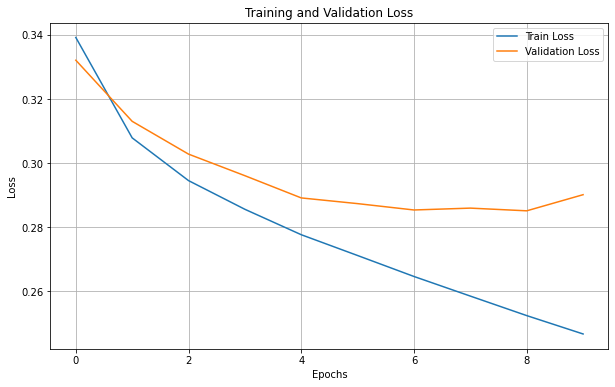

In [54]:
# simplebaseline model

train_tfrecords = os.path.join(TFRECORD_PATH, 'train*')
val_tfrecords = os.path.join(TFRECORD_PATH, 'val*')
epochs = 10
batch_size = 16
num_heatmap = 16
learning_rate = 0.0007

SAVE_DIR = '/aiffel/aiffel/workplace/01.02_GD_8.Pose Estimation/'  # 모델 및 손실 저장 경로
model_2 = 'Simplebaseline'

best_model_file = train(epochs, learning_rate, num_heatmap, batch_size, train_tfrecords, val_tfrecords, model_2, SAVE_DIR)

- 실제로 0에폭 부터 측정 
- 8에폭 지점은 실제 9에폭에서 측정된 loss이며 이때 가장 최소 loss값 저장 확인
- simplebaseline val loss : 0.2851
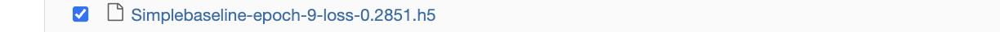

## Hourglass model 훈련

- 10에폭 돌린뒤 비교 실험

In [ ]:
# Hourglass model

train_tfrecords = os.path.join(TFRECORD_PATH, 'train*')
val_tfrecords = os.path.join(TFRECORD_PATH, 'val*')
epochs = 10
batch_size = 16
num_heatmap = 16
learning_rate = 0.0007

SAVE_DIR = '/aiffel/aiffel/workplace/01.02_GD_8.Pose Estimation/'  # 모델 및 손실 저장 경로
model_1 = 'StackedHourglassNetwork'

best_model_file_1 = train(epochs, learning_rate, num_heatmap, batch_size, train_tfrecords, val_tfrecords, model_1, SAVE_DIR)

Start training...
Start epoch 1 with learning rate 0.0007
Epoch 1 train loss 1.5340973138809204
Epoch 1 val loss 1.406054973602295
Model /aiffel/aiffel/workplace/01.02_GD_8.Pose Estimation/StackedHourglassNetwork-epoch-1-loss-1.4061.h5 saved.
Start epoch 2 with learning rate 0.0007
Epoch 2 train loss 1.3560172319412231
Epoch 2 val loss 1.307621955871582
Model /aiffel/aiffel/workplace/01.02_GD_8.Pose Estimation/StackedHourglassNetwork-epoch-2-loss-1.3076.h5 saved.
Start epoch 3 with learning rate 0.0007
Epoch 3 train loss 1.2715965509414673
Epoch 3 val loss 1.2475497722625732
Model /aiffel/aiffel/workplace/01.02_GD_8.Pose Estimation/StackedHourglassNetwork-epoch-3-loss-1.2475.h5 saved.
Start epoch 4 with learning rate 0.0007
Epoch 4 train loss 1.2200251817703247
Epoch 4 val loss 1.2139846086502075
Model /aiffel/aiffel/workplace/01.02_GD_8.Pose Estimation/StackedHourglassNetwork-epoch-4-loss-1.2140.h5 saved.
Start epoch 5 with learning rate 0.0007
Epoch 5 train loss 1.1812446117401123
Ep

- 에폭당 손실 기록 / *로 병목화 되어 일단 기록 저장
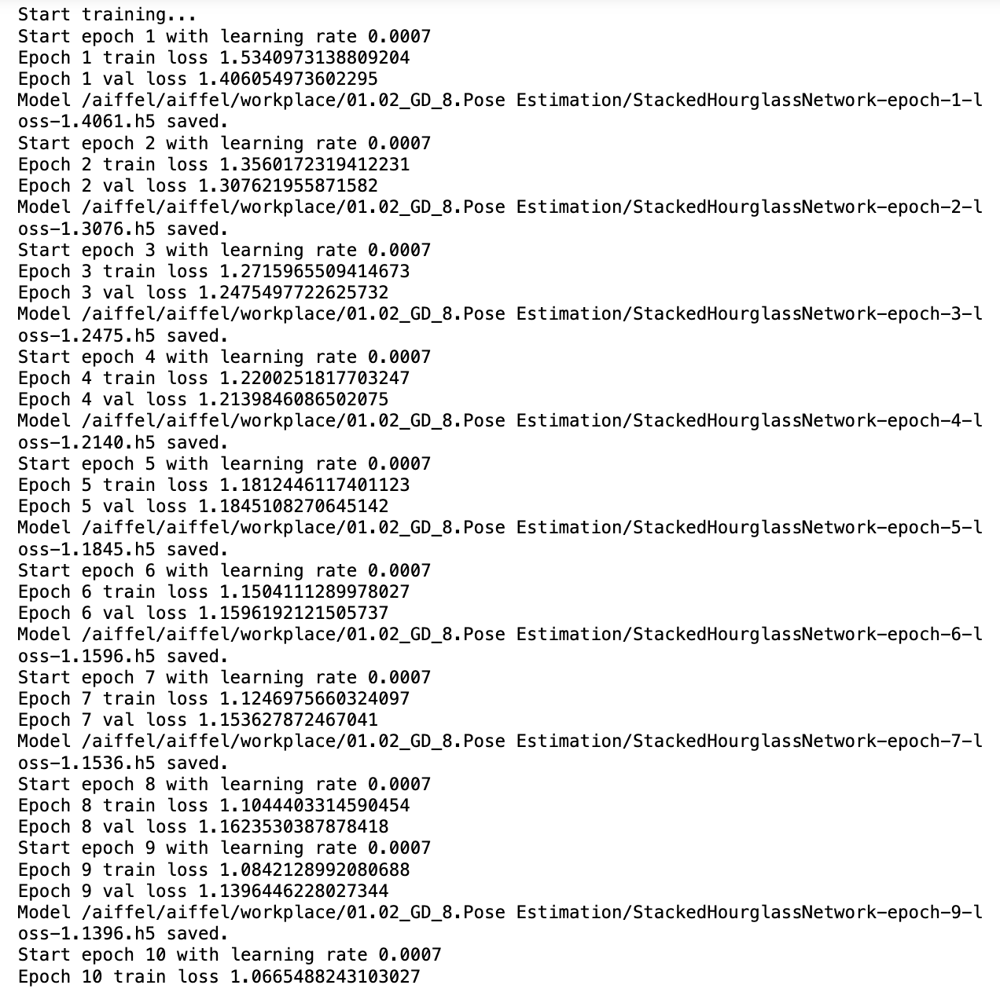

hello


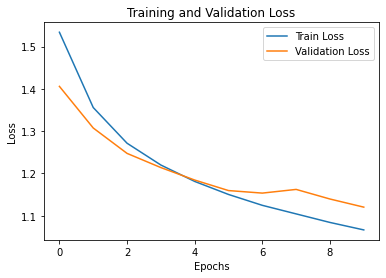

In [60]:
# 저장된 손실 시각화
import pandas as pd
import matplotlib.pyplot as plt

losses_df = pd.read_csv('/aiffel/aiffel/workplace/01.02_GD_8.Pose Estimation/StackedHourglassNetwork_losses.csv')
plt.plot(losses_df['Train Loss'], label='Train Loss')
plt.plot(losses_df['Validation Loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

### 훈련 결과 Train loss & Val Loss 비교
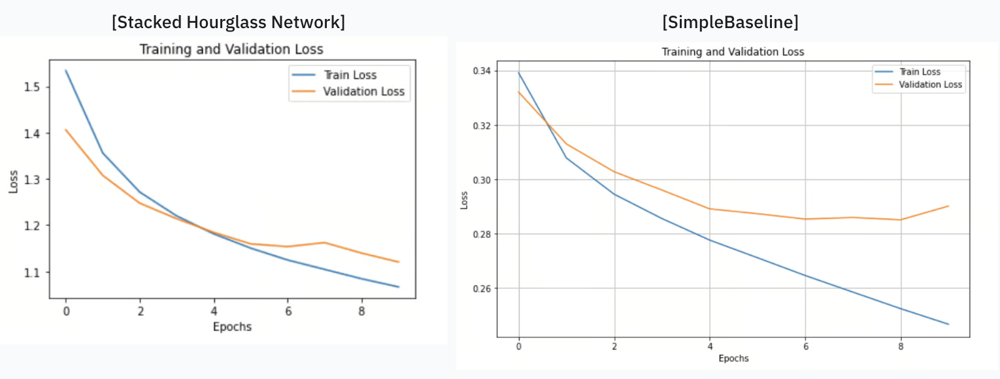
- 두 모델 모두 학습이 잘 진행 되는것을 확인.
- simplebaseline이 train 및 val loss가 낮음을 확인 가능
- simplebaseline의 9(0에폭부터 계산되어 8에폭지점은 실제 9에폭을 의미)에폭 지점에서 val loss가 증가하는 것을 확인하였으나, 과적합의 포인트인지는 10에폭 이상을 더 돌려봐야 알 수 있을 것 같다.
- StackedHourglassNetwork val loss : 1.1396
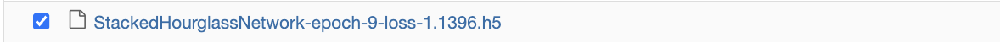
- simplebaseline val loss : 0.2851
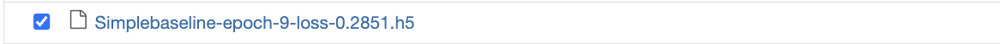

## STEP 3 : 두 모델의 비교  
실습에서 다룬 StackedHourglass Network와 Simplebaseline 모델을 둘 다 동일한 Epoch 수만큼 학습하여 그 결과를 비교해 봅니다.

Pose Estimation 결과 시각화 (정성적 비교)  
학습 진행 경과 (loss 감소 현황)  
가급적 두 모델 모두 최소 3epoch 이상, (5epoch 이상 권장)을 학습하기 바랍니다.  

메트릭 추가로 알아보기
점과 점사이 알아보기
분포형태로 알아보기
히트맵


## 정성적 비교

In [62]:
hourglass_model_path = '/aiffel/aiffel/workplace/01.02_GD_8.Pose Estimation/StackedHourglassNetwork-epoch-10-loss-1.1204.h5'
# hourglass: 10에폭 지점 모델 load
simplebaseline_model_path =  '/aiffel/aiffel/workplace/01.02_GD_8.Pose Estimation/Simplebaseline-epoch-9-loss-0.2851.h5'
# simplebaseline: 9에폭 지점의 모델 load

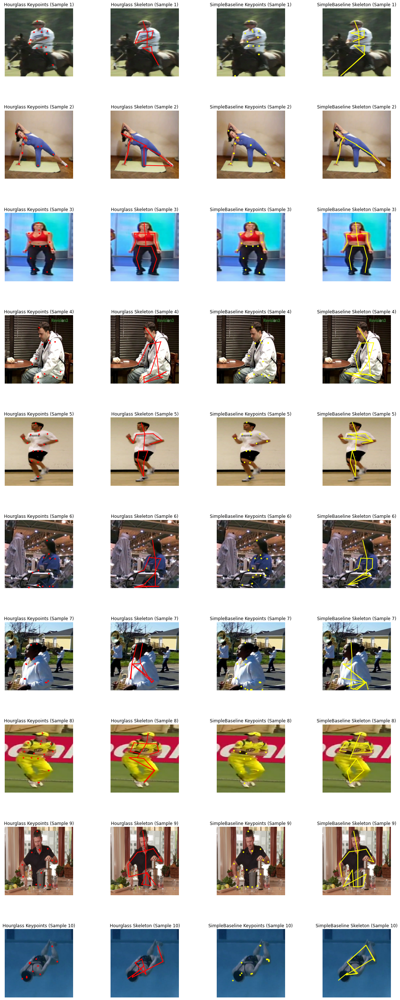

In [74]:
def visualize_comparison(hourglass_model, simplebaseline_model, val_dataset, num_samples=10):
    """
    val_dataset에서 샘플을 추출하여 두 모델의 keypoints와 skeleton 결과를 비교 시각화.
    """
    fig, axes = plt.subplots(num_samples, 4, figsize=(20, 5 * num_samples))
    plt.subplots_adjust(hspace=0.5, wspace=0.2)  # 간격 조정

    for i, (images, labels) in enumerate(val_dataset.take(num_samples)):
        # 데이터에서 이미지 텐서 추출 및 전처리
        image_tensor = images[0]  # 첫 번째 이미지를 사용
        image_array = ((image_tensor.numpy() + 1) * 127.5).astype(np.uint8)  # 정규화 해제

        # Hourglass 모델 예측
        hourglass_output = hourglass_model(tf.expand_dims(image_tensor, axis=0), training=False)
        if isinstance(hourglass_output, list):  # 리스트인 경우 마지막 단계의 결과 사용
            hourglass_output = hourglass_output[-1]
        hourglass_output = tf.squeeze(hourglass_output, axis=0)  # 배치 차원 제거
        hourglass_keypoints = extract_keypoints_from_heatmap(hourglass_output.numpy())

        # SimpleBaseline 모델 예측
        simplebaseline_output = simplebaseline_model(tf.expand_dims(image_tensor, axis=0), training=False)
        simplebaseline_output = tf.squeeze(simplebaseline_output, axis=0)  # 배치 차원 제거
        simplebaseline_keypoints = extract_keypoints_from_heatmap(simplebaseline_output.numpy())

        # Hourglass 결과 시각화
        axes[i, 0].imshow(image_array)
        axes[i, 0].scatter([kp[0] * image_array.shape[1] for kp in hourglass_keypoints],
                           [kp[1] * image_array.shape[0] for kp in hourglass_keypoints],
                           s=10, c='red', marker='o')  # 키포인트 시각화
        axes[i, 0].set_title(f"Hourglass Keypoints (Sample {i+1})")
        axes[i, 0].axis("off")

        axes[i, 1].imshow(image_array)
        for bone in MPII_BONES:
            joint_1 = hourglass_keypoints[bone[0]]
            joint_2 = hourglass_keypoints[bone[1]]
            axes[i, 1].plot([joint_1[0] * image_array.shape[1], joint_2[0] * image_array.shape[1]],
                            [joint_1[1] * image_array.shape[0], joint_2[1] * image_array.shape[0]],
                            linewidth=2, c='red')  # 스켈레톤 시각화
        axes[i, 1].set_title(f"Hourglass Skeleton (Sample {i+1})")
        axes[i, 1].axis("off")

        # SimpleBaseline 결과 시각화
        axes[i, 2].imshow(image_array)
        axes[i, 2].scatter([kp[0] * image_array.shape[1] for kp in simplebaseline_keypoints],
                           [kp[1] * image_array.shape[0] for kp in simplebaseline_keypoints],
                           s=10, c='yellow', marker='o')  # 키포인트 시각화
        axes[i, 2].set_title(f"SimpleBaseline Keypoints (Sample {i+1})")
        axes[i, 2].axis("off")

        axes[i, 3].imshow(image_array)
        for bone in MPII_BONES:
            joint_1 = simplebaseline_keypoints[bone[0]]
            joint_2 = simplebaseline_keypoints[bone[1]]
            axes[i, 3].plot([joint_1[0] * image_array.shape[1], joint_2[0] * image_array.shape[1]],
                            [joint_1[1] * image_array.shape[0], joint_2[1] * image_array.shape[0]],
                            linewidth=2, c='yellow')  # 스켈레톤 시각화
        axes[i, 3].set_title(f"SimpleBaseline Skeleton (Sample {i+1})")
        axes[i, 3].axis("off")

    # 나머지 빈 플롯 비우기 (num_samples < 10일 경우)
    for j in range(i + 1, num_samples):
        for k in range(4):
            axes[j, k].axis("off")

    plt.show()

# 모델 로드 및 시각화 실행
hourglass_model = StackedHourglassNetwork(IMAGE_SHAPE, 4, 1, num_heatmap)
hourglass_model.load_weights(hourglass_model_path)

simplebaseline_model = Simplebaseline(input_shape=(256, 256, 3))
simplebaseline_model.load_weights(simplebaseline_model_path)

visualize_comparison(hourglass_model, simplebaseline_model, val_dataset)

- val dataset 기반, 두 모델을 정성적으로 비교
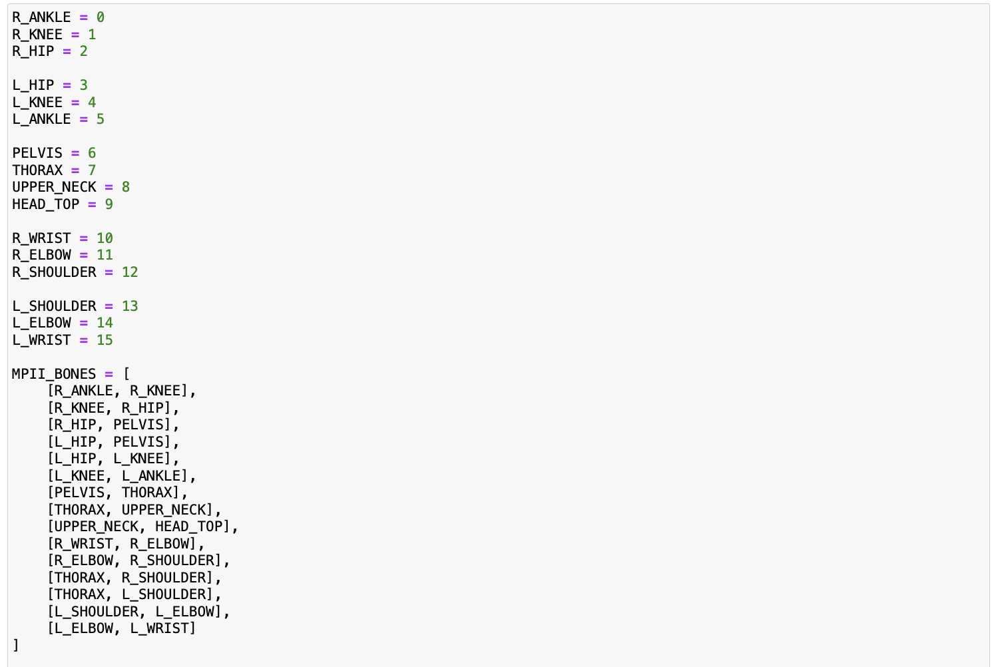

- StackedHourglassNetwork 와 Simplebasline 모델을 비교
- 두 모델 모두 정면을 바라보는 시점의 pose는 예측을 잘함 
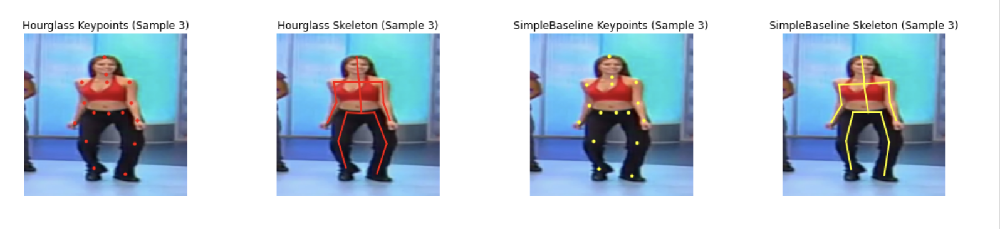
- 정면이 아닌 방향, 서있는 자세가 아닌 다른 자세들에 대해서는 StackedHourglassNetwork가 정성적으로 더 좋은 성능을 보임
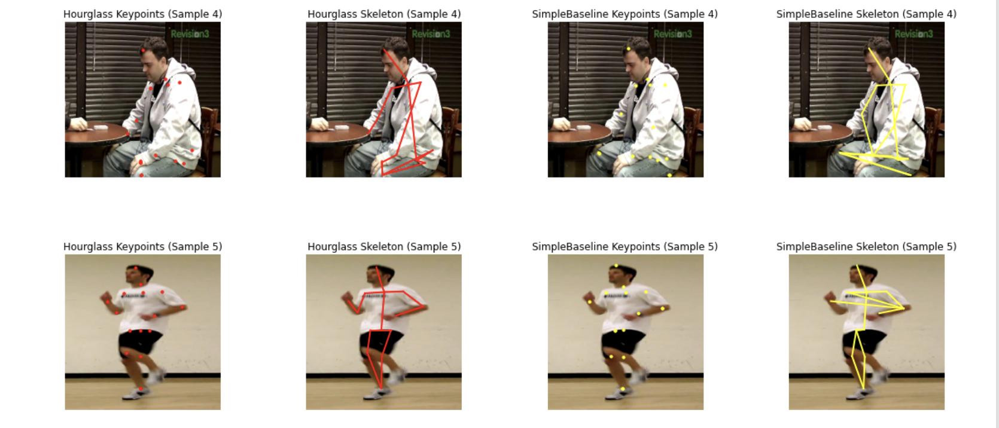
- 하지만, StackedHourglassNetwork 또한 마찬가지로 배포할 정도의 성능 수준은 아니라고 판단됨
    - 사람의 관절이 아닌 물체에 keypoint를 설정하거나, 설정된 keypoint들이 연결된 skeleton들의 연결이 잘못된 예측이 많음
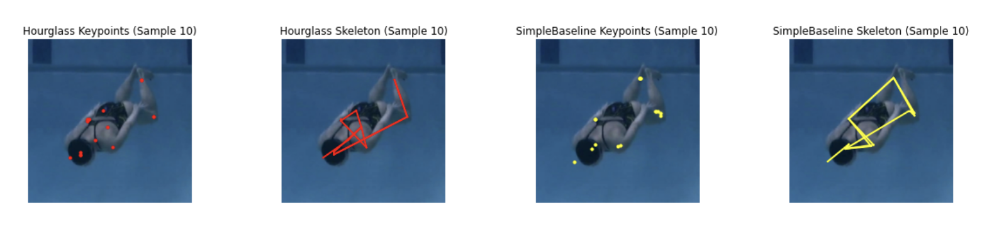
- 훈련과정을 보았을때 val loss가 더 낮은 Simplebasline 모델의 성능이 더 좋을것이라고 기대하였지만 그렇지 않았다. val loss가 성능 평가의 기준은 아니지만, 기대한바와 달라 이유가 궁금해 졌다. => simplebaseline 모델 에폭별 비교실험 진행

## 실험1-2). Simplebasline 모델 에폭별 비교 - 2에폭 / 5에폭 / 9에폭 모델 load

In [98]:
# simplebaseline: 2에폭 지점의 모델 load - Val Loss : 0.3151
simplebaseline_model_path_epoch2 =  '/aiffel/aiffel/workplace/01.02_GD_8.Pose Estimation/Simplebaseline-epoch-2-loss-0.3151.h5'

# simplebaseline: 5에폭 지점의 모델 load - Val Loss : 0.2923
simplebaseline_model_path_epoch5 =  '/aiffel/aiffel/workplace/01.02_GD_8.Pose Estimation/Simplebaseline-epoch-5-loss-0.2923.h5'

# simplebaseline: 9에폭 지점의 모델 load - Val Loss : 0.2851
simplebaseline_model_path_epoch9 =  '/aiffel/aiffel/workplace/01.02_GD_8.Pose Estimation/Simplebaseline-epoch-9-loss-0.2851.h5'

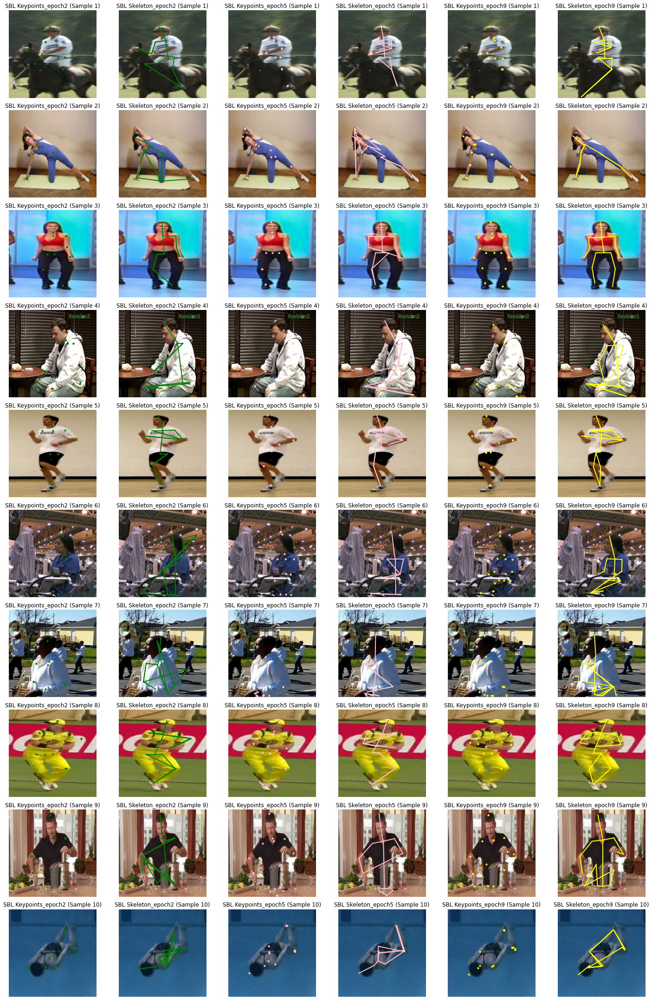

In [108]:
def visualize_comparison(simplebaseline_model_1, simplebaseline_model_2, simplebaseline_model_3, val_dataset, num_samples=10):
    """
    val_dataset에서 샘플을 추출하여 두 모델의 keypoints와 skeleton 결과를 비교 시각화.
    """
    fig, axes = plt.subplots(num_samples, 6, figsize=(20, 3 * num_samples))
    plt.subplots_adjust(hspace=0.1, wspace=0.2)  # 각 줄별 그림들(subplot들의 간격 조정
    # wspace 서브플롯간 가로간격

    for i, (images, labels) in enumerate(val_dataset.take(num_samples)):
        # 데이터에서 이미지 텐서 추출 및 전처리
        image_tensor = images[0]  # 첫 번째 이미지를 사용
        image_array = ((image_tensor.numpy() + 1) * 127.5).astype(np.uint8)  # 정규화 해제

        # SimpleBaseline 모델 예측_에폭2
        simplebaseline_output1 = simplebaseline_model_1(tf.expand_dims(image_tensor, axis=0), training=False)
        simplebaseline_output1 = tf.squeeze(simplebaseline_output1, axis=0)  # 배치 차원 제거
        simplebaseline_keypoints1 = extract_keypoints_from_heatmap(simplebaseline_output1.numpy())

        # SimpleBaseline 모델 예측_에폭5
        simplebaseline_output2 = simplebaseline_model_2(tf.expand_dims(image_tensor, axis=0), training=False)
        simplebaseline_output2 = tf.squeeze(simplebaseline_output2, axis=0)  # 배치 차원 제거
        simplebaseline_keypoints2 = extract_keypoints_from_heatmap(simplebaseline_output2.numpy())
        
        # SimpleBaseline 모델 예측_에폭9
        simplebaseline_output3 = simplebaseline_model_3(tf.expand_dims(image_tensor, axis=0), training=False)
        simplebaseline_output3 = tf.squeeze(simplebaseline_output3, axis=0)  # 배치 차원 제거
        simplebaseline_keypoints3 = extract_keypoints_from_heatmap(simplebaseline_output3.numpy())

        
#         # Hourglass 결과 시각화
#         axes[i, 0].imshow(image_array)
#         axes[i, 0].scatter([kp[0] * image_array.shape[1] for kp in hourglass_keypoints],
#                            [kp[1] * image_array.shape[0] for kp in hourglass_keypoints],
#                            s=10, c='red', marker='o')  # 키포인트 시각화
#         axes[i, 0].set_title(f"Hourglass Keypoints (Sample {i+1})")
#         axes[i, 0].axis("off")

#         axes[i, 1].imshow(image_array)
#         for bone in MPII_BONES:
#             joint_1 = hourglass_keypoints[bone[0]]
#             joint_2 = hourglass_keypoints[bone[1]]
#             axes[i, 1].plot([joint_1[0] * image_array.shape[1], joint_2[0] * image_array.shape[1]],
#                             [joint_1[1] * image_array.shape[0], joint_2[1] * image_array.shape[0]],
#                             linewidth=2, c='red')  # 스켈레톤 시각화
#         axes[i, 1].set_title(f"Hourglass Skeleton (Sample {i+1})")
#         axes[i, 1].axis("off")

        # SimpleBaseline 결과 시각화_1
        axes[i, 0].imshow(image_array)
        axes[i, 0].scatter([kp[0] * image_array.shape[1] for kp in simplebaseline_keypoints1],
                           [kp[1] * image_array.shape[0] for kp in simplebaseline_keypoints1],
                           s=10, c='green', marker='o')  # 키포인트 시각화
        axes[i, 0].set_title(f"SBL Keypoints_epoch2 (Sample {i+1})")
        axes[i, 0].axis("off")

        axes[i, 1].imshow(image_array)
        for bone in MPII_BONES:
            joint_1 = simplebaseline_keypoints1[bone[0]]
            joint_2 = simplebaseline_keypoints1[bone[1]]
            axes[i, 1].plot([joint_1[0] * image_array.shape[1], joint_2[0] * image_array.shape[1]],
                            [joint_1[1] * image_array.shape[0], joint_2[1] * image_array.shape[0]],
                            linewidth=2, c='green')  # 스켈레톤 시각화
        axes[i, 1].set_title(f"SBL Skeleton_epoch2 (Sample {i+1})")
        axes[i, 1].axis("off")
        
        # SimpleBaseline 결과 시각화_2
        axes[i, 2].imshow(image_array)
        axes[i, 2].scatter([kp[0] * image_array.shape[1] for kp in simplebaseline_keypoints2],
                           [kp[1] * image_array.shape[0] for kp in simplebaseline_keypoints2],
                           s=10, c='pink', marker='o')  # 키포인트 시각화
        axes[i, 2].set_title(f"SBL Keypoints_epoch5 (Sample {i+1})")
        axes[i, 2].axis("off")

        axes[i, 3].imshow(image_array)
        for bone in MPII_BONES:
            joint_1 = simplebaseline_keypoints2[bone[0]]
            joint_2 = simplebaseline_keypoints2[bone[1]]
            axes[i, 3].plot([joint_1[0] * image_array.shape[1], joint_2[0] * image_array.shape[1]],
                            [joint_1[1] * image_array.shape[0], joint_2[1] * image_array.shape[0]],
                            linewidth=2, c='pink')  # 스켈레톤 시각화
        axes[i, 3].set_title(f"SBL Skeleton_epoch5 (Sample {i+1})")
        axes[i, 3].axis("off")
        
        
        # SimpleBaseline 결과 시각화_3
        axes[i, 4].imshow(image_array)
        axes[i, 4].scatter([kp[0] * image_array.shape[1] for kp in simplebaseline_keypoints3],
                           [kp[1] * image_array.shape[0] for kp in simplebaseline_keypoints3],
                           s=10, c='yellow', marker='o')  # 키포인트 시각화
        axes[i, 4].set_title(f"SBL Keypoints_epoch9 (Sample {i+1})")
        axes[i, 4].axis("off")

        axes[i, 5].imshow(image_array)
        for bone in MPII_BONES:
            joint_1 = simplebaseline_keypoints3[bone[0]]
            joint_2 = simplebaseline_keypoints3[bone[1]]
            axes[i, 5].plot([joint_1[0] * image_array.shape[1], joint_2[0] * image_array.shape[1]],
                            [joint_1[1] * image_array.shape[0], joint_2[1] * image_array.shape[0]],
                            linewidth=2, c='yellow')  # 스켈레톤 시각화
        axes[i, 5].set_title(f"SBL Skeleton_epoch9 (Sample {i+1})")
        axes[i, 5].axis("off")
        

    # 나머지 빈 플롯 비우기 (num_samples < 10일 경우)
    for j in range(i + 1, num_samples):
        for k in range(4):
            axes[j, k].axis("off")
            
    plt.tight_layout()
    plt.show()

# # 모델 로드 및 시각화 실행
# hourglass_model = StackedHourglassNetwork(IMAGE_SHAPE, 4, 1, num_heatmap)
# hourglass_model.load_weights(hourglass_model_path)

simplebaseline_model_1 = Simplebaseline(input_shape=(256, 256, 3))
simplebaseline_model_1.load_weights(simplebaseline_model_path_epoch2)

simplebaseline_model_2 = Simplebaseline(input_shape=(256, 256, 3))
simplebaseline_model_2.load_weights(simplebaseline_model_path_epoch5)

simplebaseline_model_3 = Simplebaseline(input_shape=(256, 256, 3))
simplebaseline_model_3.load_weights(simplebaseline_model_path_epoch9)


visualize_comparison(simplebaseline_model_1, simplebaseline_model_2, simplebaseline_model_3, val_dataset)

- 에폭 시점별로 모델을 비교하였을때, 기대했던 바와 같이 val loss가 가장 낮은 모델이 정성적평가 결과 또한 좋게 나왔다.
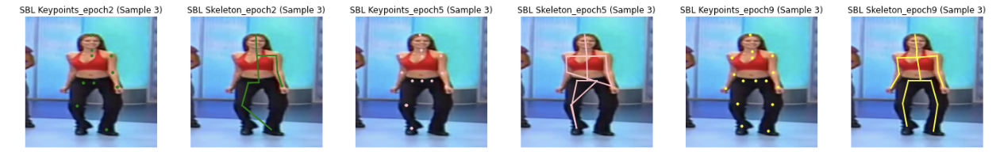
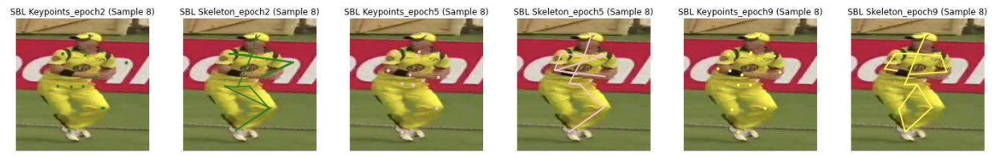
- 하지만 위 모델 또한 완벽한 성능을 보이지 않아, 객관적으로 모델간 평가가 어려움을 느꼈다.
- 20에폭 이상을 더 돌려봐야할 필요성을 느낌

## 정량적 비교 개념정리

1. PCK (Percentage of Correct Keypoints)
    - 특정 임계값(Threshold) 이내로 예측된 Keypoint의 비율을 계산
    - 예측값이 Ground Truth에서 허용 오차(Threshold) 이내에 위치한 경우를 “정답”으로 간주
    - Threshold는 일반적으로 Head Size(머리 크기)나 Bounding Box 크기의 비율로 정의
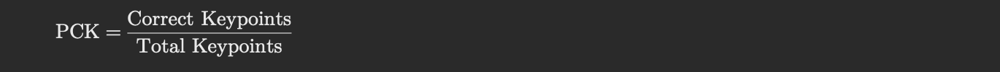

2. mAP (Mean Average Precision
    - Keypoint Detection에서 각 Keypoint에 대해 Precision-Recall 곡선을 계산한 후 평균값을 측정.
    - 정확한 위치에 예측된 Keypoint의 비율을 평가.
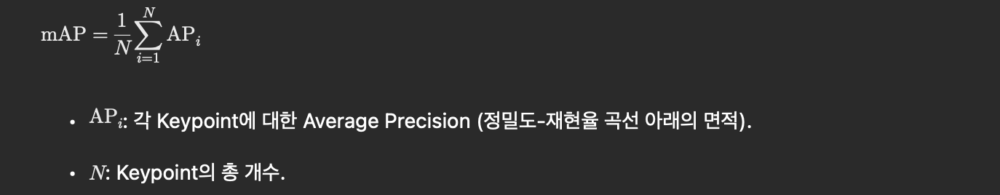

## 최종회고

- SBL의 정성적 결과가 더 좋지 않은 이유가 뭘까...?
- 두 모델 모두 20에폭 이상씩 더 돌려봐야 정성적인 평가도 구체적으로 할 수 있을 것 같다.
- strategy라는 TF의 분산학습을 적용하면서 고생을 많이했는데 이번 기회에 위 전략객체의 필요성과 작동방식을 살펴 볼 수 있어서 좋았다.
- 위 두 모델 외에 Deep High-Resolution Network (HRNet)을 통해 결과를 비교해보고 싶다.



# 디버깅 1차_simplebaseline model 학습 중
- class Trainer_sbl과 Trainer_hg를 만들어 독립적으로 모델을 훈련하고자 함 
- 체크포인트를 내부에 설정하는데 있어 오류가 일어나 -> save.model을 활용하기로 변경
- 추가로 resnet 백본을 simplebaseline 모델에 넣어야만 최종 훈련이 진행됨을 확인

```RuntimeError: Mixing different tf.distribute.Strategy objects: <tensorflow.python.distribute.mirrored_strategy.MirroredStrategy object at 0x78cd6a55abb0> is not <tensorflow.python.distribute.mirrored_strategy.MirroredStrategy object at 0x78cf12874e50```

- strategy를 반복 선언시, tf.distribute.MirroredStrategy 객체가 혼합되어 사용되어 충돌로 인한 학습 에러가 일어남 
- 커널 재시작 및 1번 선언 이후 주석처리 하여 해결


In [ ]:
# class Trainer_sbl(object):
#     def __init__(self,
#                  model,
#                  epochs,
#                  global_batch_size,
#                  strategy,
#                  initial_learning_rate,
#                  save_path,
#                  model_names):
#         self.model = model
#         self.epochs = epochs
#         self.strategy = strategy
#         self.global_batch_size = global_batch_size
#         self.loss_object = tf.keras.losses.MeanSquaredError(
#             reduction=tf.keras.losses.Reduction.NONE)
#         self.optimizer = tf.keras.optimizers.Adam(
#             learning_rate=initial_learning_rate)

#         self.current_learning_rate = initial_learning_rate
#         self.last_val_loss = math.inf
#         self.lowest_val_loss = math.inf
#         self.patience_count = 0
#         self.max_patience = 10
#         self.best_model = None
        
#         self.train_losses = []  # Train 손실 기록 리스트 추가
#         self.val_losses = []    # Validation 손실 기록 리스트 추가
#         self.save_path = save_path  # 모델 및 손실 저장 경로 설정
#         self.model_names = model_names

#     def lr_decay(self):
#         if self.patience_count >= self.max_patience:
#             self.current_learning_rate /= 10.0
#             self.patience_count = 0
#         elif self.last_val_loss == self.lowest_val_loss:
#             self.patience_count = 0
#         self.patience_count += 1

#         self.optimizer.learning_rate = self.current_learning_rate

#     def lr_decay_step(self, epoch):
#         if epoch == 25 or epoch == 50 or epoch == 75:
#             self.current_learning_rate /= 10.0
#         self.optimizer.learning_rate = self.current_learning_rate

#     def compute_loss(self, labels, outputs):
#         loss = 0.
#         weights = tf.cast(labels > 0, dtype=tf.float32) * 81 + 1.
#         loss += tf.math.reduce_mean((tf.math.square(labels - outputs) * weights) * (1. / self.global_batch_size))
#         return loss

#     def train_step(self, inputs):
#         images, labels = inputs
#         with tf.GradientTape() as tape:
#             outputs = self.model(images, training=True)
#             loss = self.compute_loss(labels, outputs)

#         grads = tape.gradient(loss, self.model.trainable_variables)
#         self.optimizer.apply_gradients(zip(grads, self.model.trainable_variables))
#         return loss

#     def val_step(self, inputs):
#         images, labels = inputs
#         outputs = self.model(images, training=False)
#         loss = self.compute_loss(labels, outputs)
#         return loss

#     def run(self, train_dist_dataset, val_dist_dataset):
#         @tf.function
#         def distributed_train_epoch(dataset):
#             total_loss = 0.0
#             num_train_batches = 0.0
#             for one_batch in dataset:
#                 per_replica_loss = self.strategy.run(self.train_step, args=(one_batch,))
#                 batch_loss = self.strategy.reduce(
#                     tf.distribute.ReduceOp.SUM, per_replica_loss, axis=None)
#                 total_loss += batch_loss
#                 num_train_batches += 1
#             return total_loss, num_train_batches

#         @tf.function
#         def distributed_val_epoch(dataset):
#             total_loss = 0.0
#             num_val_batches = 0.0
#             for one_batch in dataset:
#                 per_replica_loss = self.strategy.run(self.val_step, args=(one_batch,))
#                 batch_loss = self.strategy.reduce(
#                     tf.distribute.ReduceOp.SUM, per_replica_loss, axis=None)
#                 total_loss += batch_loss
#                 num_val_batches += 1
#             return total_loss, num_val_batches

#         for epoch in range(1, self.epochs + 1):
#             self.lr_decay()
#             print(f"Start epoch {epoch} with learning rate {self.current_learning_rate}")

#             train_total_loss, num_train_batches = distributed_train_epoch(train_dist_dataset)
#             train_loss = train_total_loss / num_train_batches
#             self.train_losses.append(train_loss.numpy())  # Train 손실 기록 추가
#             print(f"Epoch {epoch} train loss {train_loss}")

#             val_total_loss, num_val_batches = distributed_val_epoch(val_dist_dataset)
#             val_loss = val_total_loss / num_val_batches
#             self.val_losses.append(val_loss.numpy())  # Validation 손실 기록 추가
#             print(f"Epoch {epoch} val loss {val_loss}")

#             # save model when reach a new lowest validation loss
#             if val_loss < self.lowest_val_loss:
#                 self.save_model(epoch, val_loss, self.model_names)
#                 self.lowest_val_loss = val_loss
#             self.last_val_loss = val_loss
            
#         self.save_losses()  # 손실 저장 호출
#         return self.best_model

#     def save_model(self, epoch, loss, model_names):
#         model_name = MODEL_PATH + '/{}-epoch-{}-loss-{:.4f}.h5'.format(model_names, epoch, loss)
#         self.model.save_weights(model_name)  # 모델 가중치 저장
#         self.best_model = model_name
#         print(f"Model {model_name} saved.")
    
#     def save_losses(self):
#         losses_path = os.path.join(self.save_path, "losses.csv")
#         import pandas as pd
#         pd.DataFrame({'Train Loss': self.train_losses, 'Validation Loss': self.val_losses}).to_csv(losses_path, index=False)
#         print(f"Losses saved to {losses_path}")

In [ ]:
# class Trainer_hg(object):
#     def __init__(self,
#                  model,
#                  epochs,
#                  global_batch_size,
#                  strategy,
#                  initial_learning_rate,
#                  save_path,
#                  model_names
#                 ):
#         self.model = model
#         self.epochs = epochs
#         self.strategy = strategy
#         self.global_batch_size = global_batch_size
#         self.loss_object = tf.keras.losses.MeanSquaredError(
#             reduction=tf.keras.losses.Reduction.NONE)
#         self.optimizer = tf.keras.optimizers.Adam(
#             learning_rate=initial_learning_rate)
#         self.model = model

#         self.current_learning_rate = initial_learning_rate
#         self.last_val_loss = math.inf
#         self.lowest_val_loss = math.inf
#         self.patience_count = 0
#         self.max_patience = 10
#         self.best_model = None
        
#         self.train_losses = []  # Train 손실 기록 리스트 추가
#         self.val_losses = []    # Validation 손실 기록 리스트 추가
#         self.save_path = save_path  # 모델 및 손실 저장 경로 설정
#         self.model_names = model_names


#     def lr_decay(self):
#         if self.patience_count >= self.max_patience:
#             self.current_learning_rate /= 10.0
#             self.patience_count = 0
#         elif self.last_val_loss == self.lowest_val_loss:
#             self.patience_count = 0
#         self.patience_count += 1

#         self.optimizer.learning_rate = self.current_learning_rate

#     def lr_decay_step(self, epoch):
#         if epoch == 25 or epoch == 50 or epoch == 75:
#             self.current_learning_rate /= 10.0
#         self.optimizer.learning_rate = self.current_learning_rate

#     def compute_loss(self, labels, outputs):
#         loss = 0
#         for output in outputs:
#             # 모든 데이터를 float32로 변환
#             labels = tf.cast(labels, tf.float32)
#             output = tf.cast(output, tf.float32)

#             weights = tf.cast(labels > 0, dtype=tf.float32) * 81.0 + 1.0
#             loss += tf.math.reduce_mean(
#                 tf.math.square(tf.cast(labels, tf.float32) - tf.cast(output, tf.float32)) * tf.cast(weights, tf.float32)
#                 ) * (1. / tf.cast(self.global_batch_size, tf.float32))
#         return loss

#     def train_step(self, inputs):
#         images, labels = inputs
#         with tf.GradientTape() as tape:
#             outputs = self.model(images, training=True)
#             loss = self.compute_loss(labels, outputs)

#         grads = tape.gradient(
#             target=loss, sources=self.model.trainable_variables)
#         self.optimizer.apply_gradients(
#             zip(grads, self.model.trainable_variables))

#         return loss

#     def val_step(self, inputs):
#         images, labels = inputs
#         outputs = self.model(images, training=False)
#         loss = self.compute_loss(labels, outputs)
#         return loss

#     def run(self, train_dist_dataset, val_dist_dataset):
#         @tf.function
#         def distributed_train_epoch(dataset):
#             tf.print('Start distributed traininng...')
#             total_loss = 0.0
#             num_train_batches = 0.0
#             for one_batch in dataset:
#                 per_replica_loss = self.strategy.run(
#                     self.train_step, args=(one_batch, ))
#                 batch_loss = self.strategy.reduce(
#                     tf.distribute.ReduceOp.SUM, per_replica_loss, axis=None)
#                 total_loss += batch_loss
#                 num_train_batches += 1
#                 tf.print('Trained batch', num_train_batches, 'batch loss',
#                          batch_loss, 'epoch total loss', total_loss / num_train_batches)
#             return total_loss, num_train_batches

#         @tf.function
#         def distributed_val_epoch(dataset):
#             total_loss = 0.0
#             num_val_batches = 0.0
#             for one_batch in dataset:
#                 per_replica_loss = self.strategy.run(
#                     self.val_step, args=(one_batch, ))
#                 num_val_batches += 1
#                 batch_loss = self.strategy.reduce(
#                     tf.distribute.ReduceOp.SUM, per_replica_loss, axis=None)
#                 tf.print('Validated batch', num_val_batches, 'batch loss',
#                          batch_loss)
#                 if not tf.math.is_nan(batch_loss):
#                     # TODO: Find out why the last validation batch loss become NaN
#                     total_loss += batch_loss
#                 else:
#                     num_val_batches -= 1

#             return total_loss, num_val_batches

#         for epoch in range(1, self.epochs + 1):
#             self.lr_decay()
#             print('Start epoch {} with learning rate {}'.format(
#                 epoch, self.current_learning_rate))

#             train_total_loss, num_train_batches = distributed_train_epoch(
#                 train_dist_dataset)
#             train_loss = train_total_loss / num_train_batches
#             self.train_losses.append(train_loss.numpy())  # Train 손실 기록 추가
#             print('Epoch {} train loss {}'.format(epoch, train_loss))

#             val_total_loss, num_val_batches = distributed_val_epoch(
#                 val_dist_dataset)
#             val_loss = val_total_loss / num_val_batches
#             self.val_losses.append(val_loss.numpy())  # Validation 손실 기록 추가
#             print('Epoch {} val loss {}'.format(epoch, val_loss))

#             # save model when reach a new lowest validation loss
#             if val_loss < self.lowest_val_loss:
#                 self.save_model(epoch, val_loss, self.model_names)
#                 self.lowest_val_loss = val_loss
#             self.last_val_loss = val_loss
            
#         self.save_losses()  # 손실 저장 호출
#         return self.best_model

#     def save_model(self, epoch, loss, model_names):
#         model_name = MODEL_PATH + '/{}-epoch-{}-loss-{:.4f}.h5'.format(model_names, epoch, loss)
#         self.model.save_weights(model_name) # 모델 가중치 저장
#         self.best_model = model_name
#         print("Model {} saved.".format(model_name))
    
#     def save_losses(self):
#         # 손실 기록을 CSV 파일로 저장
#         losses_path = os.path.join(self.save_path, "losses.csv")
#         import pandas as pd
#         pd.DataFrame({'Train Loss': self.train_losses, 'Validation Loss': self.val_losses}).to_csv(losses_path, index=False)
#         print(f"Losses saved to {losses_path}")
# print('슝=3')


- Loss 시각화를 위해 train val loss 리스트를 추가
- run 메서드 내부 self.train_losses.append(train_loss.numpy()) 통해 손실 기록 추가


In [ ]:
# IMAGE_SHAPE = (256, 256, 3)
# HEATMAP_SIZE = (64, 64)

# def create_dataset(tfrecords, batch_size, num_heatmap, is_train):
#     preprocess = Preprocessor(
#         IMAGE_SHAPE, (HEATMAP_SIZE[0], HEATMAP_SIZE[1], num_heatmap), is_train)

#     dataset = tf.data.Dataset.list_files(tfrecords)
#     dataset = tf.data.TFRecordDataset(dataset)
#     dataset = dataset.map(
#         preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE)

#     if is_train:
#         dataset = dataset.shuffle(batch_size)

#     dataset = dataset.batch(batch_size)
#     dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

#     return dataset

# print('슝=3')


In [ ]:
# strategy = tf.distribute.MirroredStrategy()

# def train_model(epochs, learning_rate, num_heatmap, batch_size, train_tfrecords, val_tfrecords, save_path, model_names):

#     global_batch_size = strategy.num_replicas_in_sync * batch_size  # 전체 배치 크기 계산

#     # 데이터셋 생성
#     train_dataset = create_dataset(
#         train_tfrecords, global_batch_size, num_heatmap, is_train=True)
#     val_dataset = create_dataset(
#         val_tfrecords, global_batch_size, num_heatmap, is_train=False)

#     # 저장 경로 확인 및 생성
#     if not os.path.exists(save_path):
#         os.makedirs(save_path)

#     with strategy.scope():  # 분산 전략 범위
#         # 모델 선택
#         if model_names == 'StackedHourglassNetwork':
#             model = StackedHourglassNetwork(IMAGE_SHAPE, 4, 1, num_heatmap)
#         elif model_names == 'Simplebaseline':
#             model = Simplebaseline(IMAGE_SHAPE)
#         else:
#             raise ValueError(f"Invalid model name: {model_names}. Choose 'StackedHourglassNetwork' or 'Simplebaseline'.")

#         # 옵티마이저 설정
#         optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

#         # 데이터셋 준비 (분산 데이터셋 생성)
#         train_dist_dataset = strategy.experimental_distribute_dataset(train_dataset)
#         val_dist_dataset = strategy.experimental_distribute_dataset(val_dataset)

#         # Trainer 설정
#         if model_names == 'StackedHourglassNetwork':
#             trainer = Trainer(
#                 model=model,
#                 epochs=epochs,
#                 global_batch_size=global_batch_size,
#                 strategy=strategy,
#                 initial_learning_rate=learning_rate,
#                 save_path=save_path,
#                 model_names=model_names
#             )
#         elif model_names == 'Simplebaseline':
#             trainer = Trainer_sbl(
#                 model=model,
#                 epochs=epochs,
#                 global_batch_size=global_batch_size,
#                 strategy=strategy,
#                 initial_learning_rate=learning_rate,
#                 save_path=save_path,
#                 model_names=model_names
#             )

#         # 학습 시작
#         print(f'Start training {model_names}...')
#         best_model = trainer.run(train_dist_dataset, val_dist_dataset)

#         # 모델 가중치 저장
#         h5_file_path = f"{save_path}/{model_names}_weights.h5"
#         model.save_weights(h5_file_path)
#         print(f"Model weights saved as: {h5_file_path}")

#         return best_model

In [ ]:
# # simplebaseline model
# train_tfrecords_sbl = os.path.join(TFRECORD_PATH, 'train*')
# val_tfrecords_sbl = os.path.join(TFRECORD_PATH, 'val*')
# epochs = 5
# batch_size = 16
# num_heatmap = 16
# learning_rate = 0.0007
# save_path = '/aiffel/aiffel/mpii/models/'  # 모델 및 손실 저장 경로
# modle_2 = 'Simplebaseline'

# best_model = train_model(epochs, learning_rate, num_heatmap, batch_size, train_tfrecords_sbl, val_tfrecords_sbl, save_path, modle_2)

In [ ]:
# # 모델 로드 
# model = Simplebaseline(IMAGE_SHAPE)  # 동일한 모델 구조 생성
# model.load_weights(f"{save_path}/Simplebaseline_weights.h5")

## =============================================
## 22장 사전학습 내용

Human Pose Estimation with Keypoint detection

운동 분야에서는 Pose estimation 기술을 활용하여 사용자의 자세를 분석하고 잘못된 자세를 감지하여 경고나 피드백을 제공해줍니다.

그 외에도 VR/AR 게임, 영화 및 애니메이션 제작, 로봇 제어, 의료, 자율 주행, 보안 등 다양한 분야에서 Pose estimation 기술이 활용되고 있고, 또 활용될 수 있습니다!




### 22-2. body language, 몸으로 하는 대화
Human pose estimation(HPE)은 크게 2D와 3D 로 나누어집니다.
(짧게 HPE 라고 부를게요. 공식 용어는 아닙니다.🤓)

2D HPE 는 2D 이미지에서 (x, y) 2차원 좌표들을 찾아내고, 3D HPE 는 2D 이미지에서 (x, y, z) 3차원 좌표들을 찾아내는 기술입니다.

그런데, 2차원 이미지에서 3차원 이미지를 복원하는 일은 굉장히 어려운 일입니다.

영상 Geometry #1 좌표계 https://darkpgmr.tistory.com/77  
영상 Geometry #7 Epipolar Geometry https://darkpgmr.tistory.com/83?category=460965
Q. 2차원 이미지에서 3차원 이미지를 복원하는 일이 왜 어려울까요? 위 링크를 참고해서 대답해 봅시다.  

A. (직관적인 예시) 2D 영상에서는 큰 원통이 멀리 있는 것과 작은 원통이 가까이 있는 것을 구분할 수 없습니다. (이론적인 설명) 카메라 행렬에서 [x y z] real world 좌표가 이미지 [u v] 좌표계로 표현될 때 z 축(거리 축) 정보가 소실되기 때문입니다.

굉장히 어렵긴 하지만 사람의 몸은 3D 환경에서 제약이 있습니다.
(실세계 좌표계에서) 발은 바닥에 있으면서 무릎은 머리 위로 갈 수 없듯이 말이죠. 그래서 이런 제약 조건을 이용해서 어느 정도 문제를 해결할 수 있습니다.

3D pose estimation 을 깊이 있게 다루기는 매우 오랜 시간이 걸리기 때문에, 오늘은 2D 영상 내에서 (x, y) pose (관절) 의 위치를 찾는 방법을 다뤄보려 합니다.

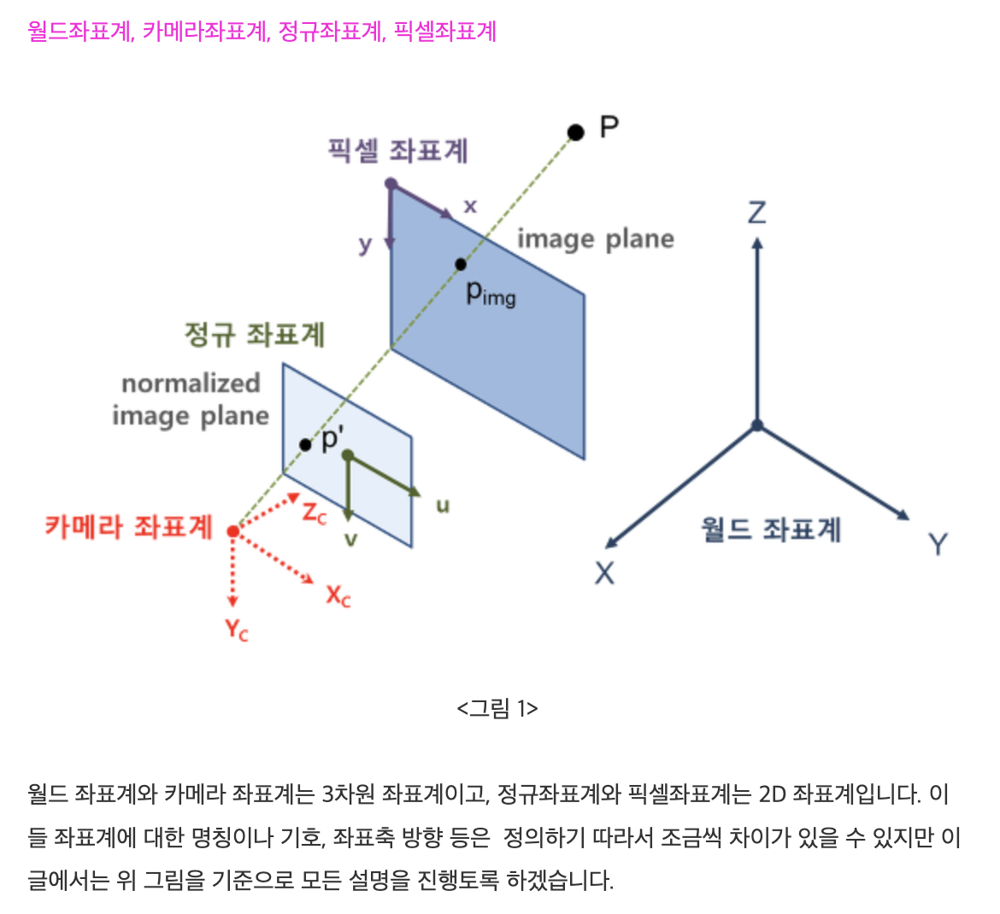

1.1 월드 좌표계 (World Coordinate System)

 

우리가 사물(물체)의 위치를 표현할 때 기준으로 삼는 좌표계입니다. 월드좌표계는 어디 하늘에서 주어져 있는 것이 아니라 문제에 따라서 우리가 임의로 잡아서 사용할 수 있는 좌표계입니다. 예를 들어, 자신의 안방 한쪽 모서리를 원점으로 잡고 한쪽 벽면 방향을 X축, 다른쪽 벽면 방향을 Y축, 하늘을 바라보는 방향을 Z축으로 잡을 수 있습니다. 좌표의 단위(unit)는 미터(meter)로 해도 되고 센티미터(centimeter)로 해도 됩니다. 중요한 점은 좌표계는 일종의 약속(protocol)이기 때문에 (3, 1, -10)이라고 했을 때 이 점이 어떤 위치인지 그 문제 내에서 만큼은 유일하게 결정될 수 있으면 되는 것입니다. 이 글에서는 월드좌표계 상의 점을 다음과 같이 대문자로 표기합니다.
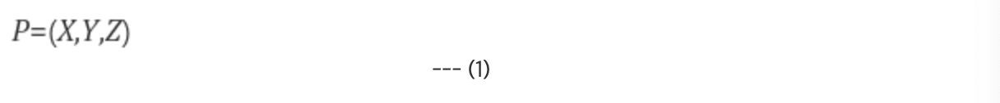

 1.2 카메라 좌표계 (Camera Coordinate System)

 

월드 좌표계가 우리가 살고 있는 공간의 한 지점을 기준으로 한 좌표계라면 카메라 좌표계는 카메라를 기준으로 한 좌표계입니다. 카메라 좌표계는 아래 그림과 같이 카메라의 초점(렌즈의 중심)을 원점, 카메라의 정면 광학축 방향을 Z축, 카메라 아래쪽 방향을 Y축, 오른쪽 방향을 X축으로 잡습니다. 기호는 월드좌표계와 구분하기 위해 아랫첨자 c를 사용하겠습니다.

 

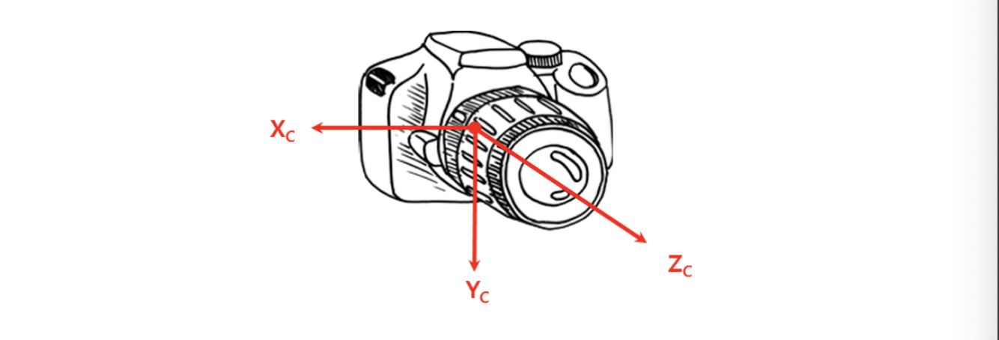
<그림 2>

 

카메라 좌표계의 단위는 물론 월드좌표계와 동일해야 할 것입니다. 즉, 월드 좌표계에서 meter 단위를 사용한다면 카메라 좌표계도 meter 단위를 사용합니다. 이 글에서는 카메라 좌표계를 기준으로 한 점의 좌표는 다음과 같이 아랫첨자 c를 사용한 대문자로 표기합니다.
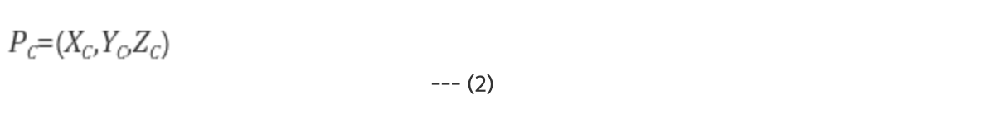

1.3 픽셀 좌표계 (Pixel Image Coordinate System)

 

편의상 픽셀 좌표계라고 썼지만, 보통은 영상좌표계(Image Coordinate System)라고 불립니다. 픽셀 좌표계는 우리가 실제 눈으로 보는 영상에 대한 좌표계로서 위 <그림 1>과 같이 이미지의 왼쪽상단(left-top) 모서리를 원점, 오른쪽 방향을 x축 증가방향, 아래쪽 방향을 y축 증가방향으로 합니다. 그리고 픽셀 좌표계의 x축, y축에 의해 결정되는 평면을 이미지 평면 (image plane)이라 부릅니다.

 

기하학적으로 볼 때, 3D 공간상의 한 점 P = (X,Y,Z)는 카메라의 초점 (또는 렌즈의 초점)을 지나서 이미지 평면의 한 점 pimg = (x, y)에 투영(projection) 됩니다. 알다시피 점 P와 점 pimg를 잇는 선(ray) 상에 있는 모든 3D 점들은 모두 pimg로 투영됩니다. 따라서 3D 점 P로부터 pimg는 유일하게 결정할 수 있지만, 반대로 영상 픽셀 pimg로부터 P를 구하는 것은 부가적인 정보 없이는 불가능합니다.

 

어쨌든 픽셀 좌표계의 단위는 픽셀(pixel)이며, 픽셀 좌표는 다음과 같이 소문자로 표기합니다.
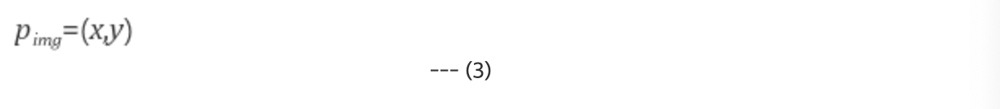


1.4 정규 좌표계 (Normalized Image Coordinate System)

 

마지막으로 가장 중요한 정규좌표계입니다. 원래는 정규 이미지 좌표계이지만 줄여서 정규 좌표계로 쓰겠습니다. 지금까지 나온 좌표계는 모두 매우 직관적인 좌표계이지만 정규 좌표계는 편의상 도입된 가상의 좌표계입니다.

 

정규 좌표계를 한마디로 설명하자면 카메라의 내부 파라미터(intrinsic parameter)의 영향을 제거한 이미지 좌표계로 볼 수 있습니다. 또한 정규 좌표계는 좌표계의 단위를 없앤(정규화된) 좌표계이며 카메라 초점과의 거리가 1인 가상의 이미지 평면을 정의하는 좌표계입니다.

 

좀더 쉽게 생각하자면, 원래의 이미지 평면을 평행이동시켜서 카메라 초점과의 거리가 1인 지점으로 옮겨놓은 이미지 평면을 생각하면 됩니다.

 

카메라 내부 파라미터에 대한 내용은 [영상처리] - 카메라 캘리브레이션 (Camera Calibration) 글을 참조하시기 바랍니다.

 

정규 좌표계의 원점은 정규 이미지 평면의 중점(광학축 Zc와의 교점)입니다 (그림 1 참조). 픽셀 좌표계와 원점의 위치가 다름에 주의하기 바랍니다. 그리고 좌표축은 픽셀 좌표계와 구분하기 위해 u, v를 사용하겠습니다.
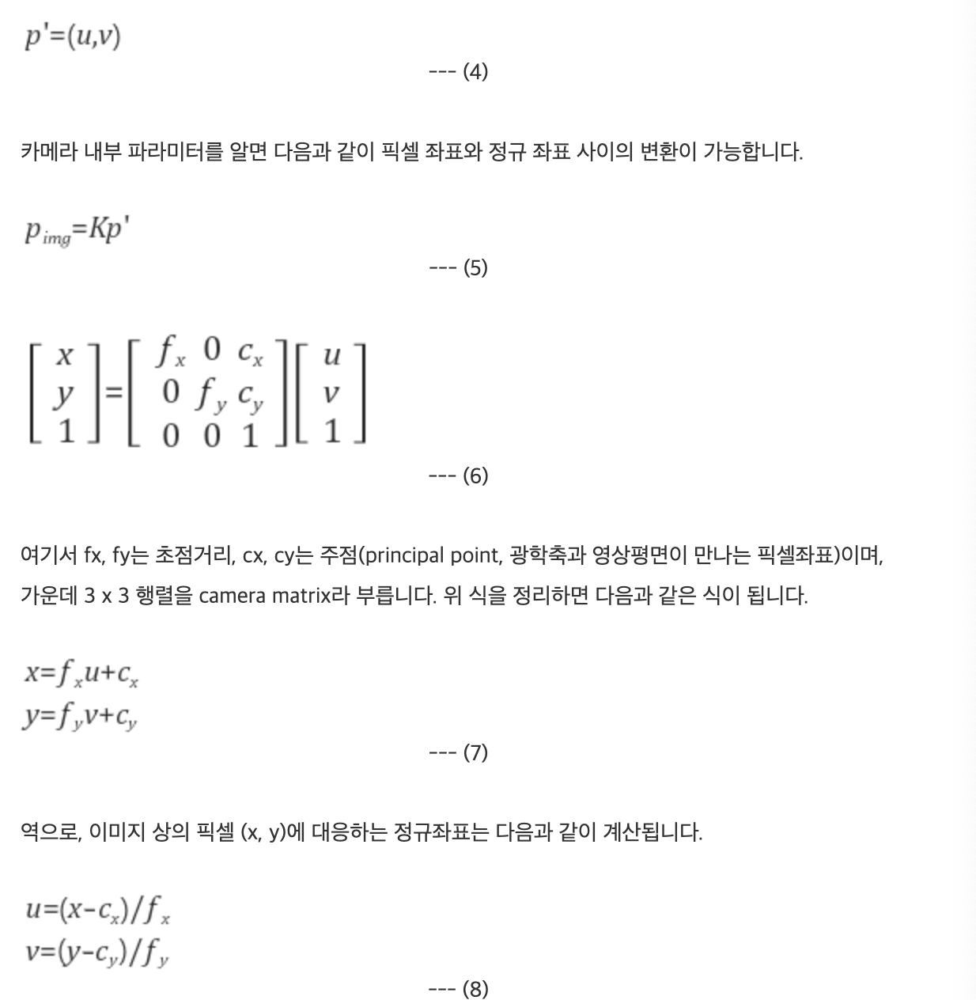

그렇다면 이렇게 굳이 정규 이미지 평면과 정규 좌표계를 도입한 이유는 무엇일까요?

 

우리가 동일한 장면을 동일한 위치와 동일한 각도에서 찍더라도 사용한 카메라에 따라서 또는 카메라 세팅에 따라서 서로 다른 영상을 얻게 됩니다. 그런데, 이러한 카메라 간의 차이는 어떤 일관된 기하학적인 해석을 하는데 있어서 불필요한 요소일 것입니다. 따라서, 이러한 요소를 제거한 정규화된 이미지 평면에서 공통된 기하학적 특성을 분석하고 이론을 수립하는 것이 보다 효과적이기 때문입니다.



### 22-3. Pose 는 face landmark 랑 비슷해요
사실 우리는 이미 2D pose estimation 을 다룬 적이 있습니다. face landmark 와 매우 비슷하지 않나요?
맞습니다. 딥러닝이나 사람의 시각에서도 실제로도 매우 비슷한 애플리케이션입니다. 입력과 출력이 개수만 다를 뿐 상당히 비슷하죠.

하지만 난이도에서 차이가 납니다.
face landmark 는 물리적으로 거의 고정되어 있는 (입이 얼굴보다 클 수 없는 걸 생각해 주세요😃) 반면, human pose 는 팔, 다리가 상대적으로 넓은 범위와 자유도를 갖는다는 것을 고려해야 합니다.
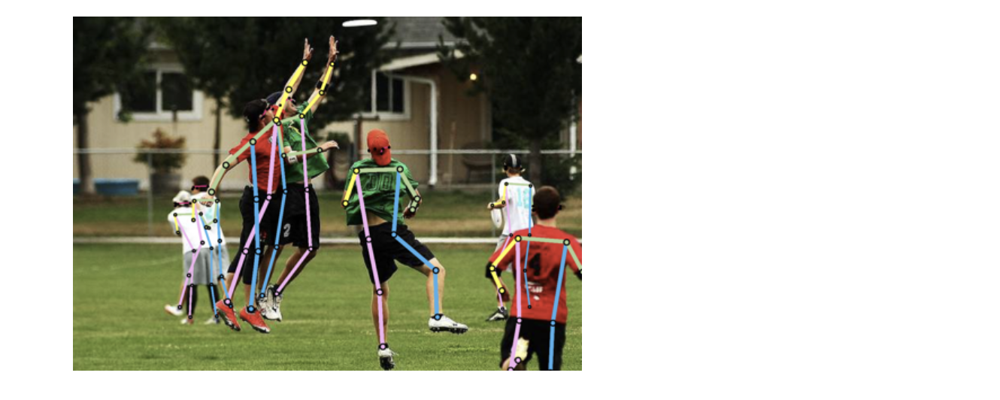
자유도가 높다는 것은 데이터 분포를 특정하기 어렵다고 표현할 수 있을 것 같습니다. 데이터 분포를 학습하기 어렵다면 당연히 학습에 더 많은 데이터가 필요하고 더 복잡한 모델을 사용해야 한다는 것을 의미합니다.

따라서 상당히 많은 사전 작업이 요구되고 사용하려는 애플리케이션에 따라 접근 방법도 달라집니다.

가장 초기에 만나는 접근법은 두 가지로 나눠질 수 있습니다.

#### 우리에게 맞는 방법은 뭘까?

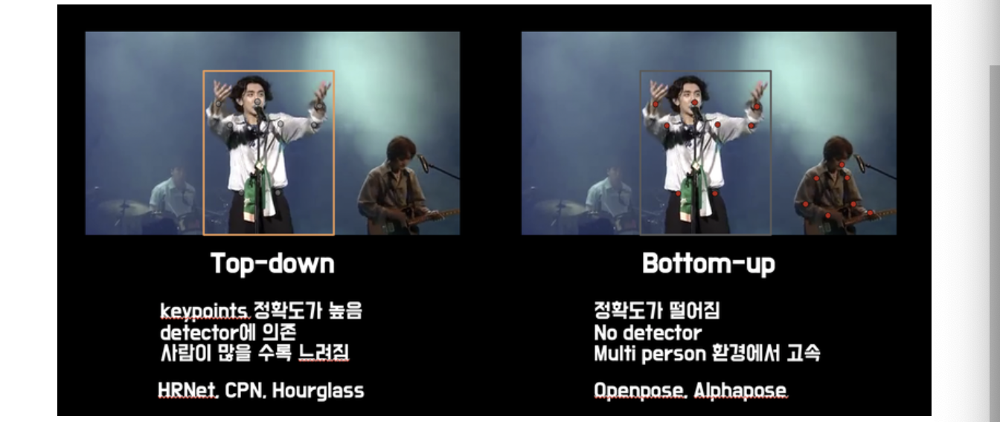
첫 번째 방법은 Top-down 방법입니다.

    - 모든 사람의 정확한 keypoint 를 찾기 위해 object detection 을 사용합니다.
    - crop 한 이미지 내에서 keypoint 를 찾아내는 방법으로 표현합니다.
    - detector가 선행되어야 하고 모든 사람마다 알고리즘을 적용해야 하기 때문에 사람이 많이 등장할 때는 느리다는 단점이 있습니다.
두 번째 방법은 Bottom-up 방법입니다.

    - detector가 없고 keypoint 를 먼저 검출합니다.
    예를 들어 손목에 해당하는 모든 점들을 검출합니다.
    - 한 사람에 해당하는 keypoint 를 clustering 합니다.
    - detector 가 없기 때문에 다수의 사람이 영상에 등장하더라도 속도 저하가 크지 않습니다. 반면 top down 방식에 비해 keypoint 검출 범위가 넓어 성능이 떨어진다는 단점이 있습니다.

얼마나 정확해야 하는지, 여러 사람이 등장하는지에 따라서 필요한 알고리즘이 달라질 수 있습니다. 핸드폰 카메라로 찍는 인물들은 대체로 소수로 등장하기 때문에 top-down 방식을 이용해도 큰 속도 저하 없이 사용할 수 있을 것이라 생각합니다.

그럼 Top-down 방법들에 대해 자세히 알아보겠습니다.

Q. Pose estimation 기술은 일반적으로 top-down 방식과 bottom-up 방식으로 구현될 수 있는데요, 각 방식의 장ㆍ단점에 대해서 생각해볼까요?
Top-down 방식은 이미지에서 객체(사람)를 먼저 찾고, 찾은 객체의 Bounding box에서 자세를 추정합니다. 원하는 객체를 먼저 검출한 뒤에 그 객체에서의 keypoint를 찾기 때문에 정확도가 Bottom-up 방식보다 상대적으로 높습니다. 단, 검출된 객체들을 순회하면서 keypoint를 찾는 것이기 때문에 상대적으로 느리다는 단점이 있습니다.

Bottom-up 방식은 이미지에서 keypoint들을 먼저 찾고, keypoint들의 상관관계를 분석하여 이들을 연결해 자세를 추정합니다. 정확도는 Top-down 방식에 비해서 떨어질 수 있지만, Detection 과정이 없기 때문에 속도가 빨라 실시간 처리에 활용이 가능하다는 장점이 있습니다.






파이토치 코드는 케라스 보다 직관적으로 표현되어 있기 때문에 지금처럼 빠르게 파악할 수 있는 장점이 있습니다.

#### 이제 파악한 지식을 이용해서 tf-simplebaseline 모델을 만들어봅시다.

SimpleBaseline - tf2

In [2]:
import os

import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

resnet = tf.keras.applications.resnet.ResNet50(include_top=False, weights='imagenet')

deconv module을 만들어주세요.






In [3]:
upconv1 = tf.keras.layers.Conv2DTranspose(256, kernel_size=(4,4), strides=(2,2), padding='same')
bn1 = tf.keras.layers.BatchNormalization()
relu1 = tf.keras.layers.ReLU()

upconv2 = tf.keras.layers.Conv2DTranspose(256, kernel_size=(4,4), strides=(2,2), padding='same')
bn2 = tf.keras.layers.BatchNormalization()
relu2 = tf.keras.layers.ReLU()

upconv3 = tf.keras.layers.Conv2DTranspose(256, kernel_size=(4,4), strides=(2,2), padding='same')
bn3 = tf.keras.layers.BatchNormalization()
relu3 = tf.keras.layers.ReLU()

deconv module에서 중복을 제거할 수 없을까요? 코드로 표현해 봅시다.






In [4]:
def _make_deconv_layer(num_deconv_layers):
    seq_model = tf.keras.models.Sequential()
    # seq_model: TensorFlow/Keras의 Sequential 모델로, 레이어를 순차적으로 쌓아나가는 방식으로 설계
    for i in range(num_deconv_layers):
        seq_model.add(tf.keras.layers.Conv2DTranspose(256, kernel_size=(4,4), strides=(2,2), padding='same'))
        seq_model.add(tf.keras.layers.BatchNormalization())
        seq_model.add(tf.keras.layers.ReLU())
    return seq_model

upconv = _make_deconv_layer(3)

In [5]:
final_layer = tf.keras.layers.Conv2D(17, kernel_size=(1,1), padding='same')





이제 각각의 요소를 합쳐 모델을 완성합니다.






In [6]:
inputs = keras.Input(shape=(256, 192, 3))
x = resnet(inputs)
x = upconv(x)
out = final_layer(x)
model = keras.Model(inputs, out)

model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 256, 192, 3)]     0         
_________________________________________________________________
resnet50 (Functional)        (None, None, None, 2048)  23587712  
_________________________________________________________________
sequential (Sequential)      (None, 64, 48, 256)       10489600  
_________________________________________________________________
conv2d (Conv2D)              (None, 64, 48, 17)        4369      
Total params: 34,081,681
Trainable params: 34,027,025
Non-trainable params: 54,656
_________________________________________________________________


가상의 이미지를 넣어서 출력이 잘 나오는지 확인하는 코드를 작성해 봅시다.






In [7]:
np_input = np.zeros((1,256,192,3), dtype=np.float32)
tf_input = tf.convert_to_tensor(np_input, dtype=tf.float32)
print('input shape')
print (tf_input.shape)
print('\n')

tf_output = model(tf_input)
print('output shape')
print (tf_output.shape)
print (tf_output[0,:10,:10,:10])

input shape
(1, 256, 192, 3)


output shape
(1, 64, 48, 17)
tf.Tensor(
[[[ 3.23008117e-03 -4.73025907e-03  8.89233314e-04 -2.07723724e-03
   -8.25472642e-03  1.31157227e-04  4.17853519e-03  1.65494122e-02
    8.30423902e-04  4.00617067e-03]
  [-4.64968756e-03  7.91562349e-03 -2.15962436e-02 -1.16743678e-02
   -4.01119515e-03  2.89897900e-04  5.20387664e-03  1.54277515e-02
    9.28170793e-03  5.33783576e-04]
  [-8.20614491e-03  7.98506662e-03 -9.98461153e-03 -1.10415090e-02
   -1.12170260e-02 -9.39213485e-03  5.48674818e-03  3.11054606e-02
   -4.04762197e-03 -2.09205342e-03]
  [ 9.03027784e-03  2.06285659e-02 -3.21240723e-02 -1.27686691e-02
   -8.38534255e-03 -1.68290287e-02  4.47754003e-03  2.93274224e-02
    1.52423102e-02 -2.48495936e-02]
  [-1.35625470e-02  1.79282948e-03 -1.00678783e-02 -1.09606441e-02
    5.79396170e-03  7.85768777e-03  1.65255740e-02  2.50047743e-02
    4.45668865e-03 -1.59877315e-02]
  [-1.37581211e-02  2.39613047e-03 -2.73958519e-02 -3.64709012e-02
   -1.579717

고생하셨습니다.

label 을 어떻게 만드는지, 48x64 의 출력을 어떻게 사용해야 하는지 실습시간에서 다뤄보도록 하겠습니다.



## ==================================================
# 23장 학습 내용


#### 이번 시간에는 Pose estimation 모델을 학습시키기 위해 활용할 수 있는 데이터셋(MPII Human Pose Dataset)에 대해 알아보고, pre-trained 된 가중치를 활용하여 테스트 이미지로 직접 모델의 성능을 확인해 볼 예정입니다.








### MPII 데이터셋 다운로드하기
오늘은 MPII Human Pose Dataset을 사용해서 Human Pose Estimation task를 위한 모델을 훈련시켜 보겠습니다.
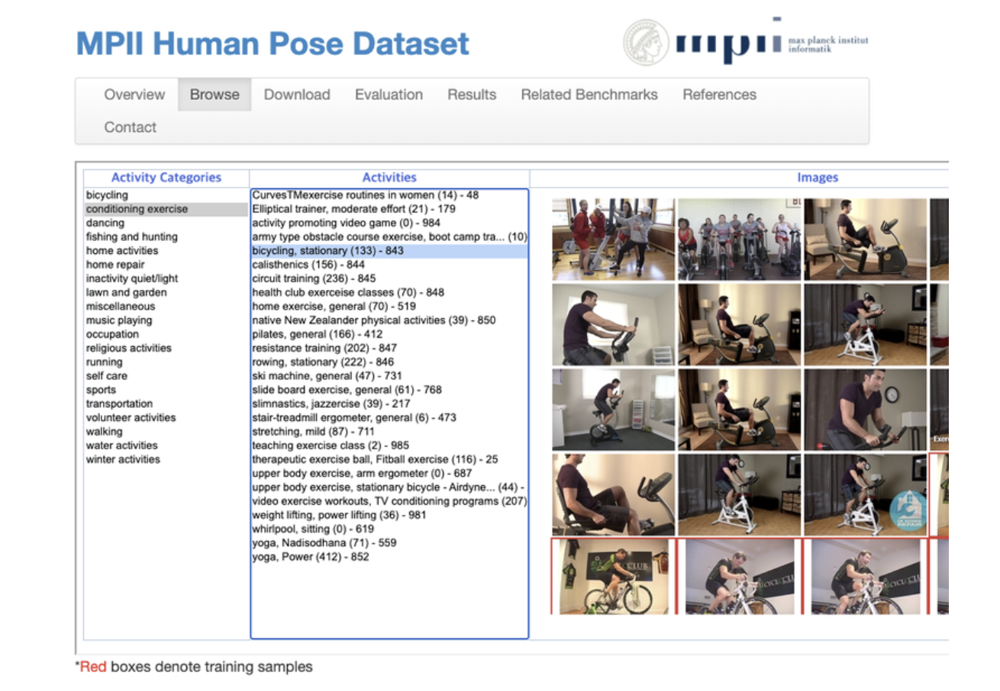


미리 준비해 둔 데이터를 연결하고 압축을 해제해 주세요.

$ mkdir -p ~/aiffel/mpii  
$ ln -s ~/data/* ~/aiffel/mpii  
$ cd ~/aiffel/mpii  
$ tar -xvf mpii_human_pose_v1.tar.gz -C .   
$ unzip mpii_human_pose_v1_u12_2.zip  
mpii_human_pose_v1_u12_2.zip 을 풀어보면 mpii_human_pose_v1_u12_1.mat 파일이 나와서 열어보기 불편한데요. 파이썬에서 읽기 쉽도록 json 파일로 변환해 두었습니다.

$ cd ~/aiffel/mpii/mpii_human_pose_v1_u12_2
$ wget https://d3s0tskafalll9.cloudfront.net/media/documents/train.json
$ wget https://d3s0tskafalll9.cloudfront.net/media/documents/validation.json
mpii.zip  
마지막으로, 오늘의 실습 코드를 프로젝트로 구성한 파일을 압축 해제합니다.

$ cd ~/aiffel/mpii && unzip mpii.zip  
이번 노드에서는 이 프로젝트 파일을 LMS환경에 맞게 편집하여 진행합니다. .py 파일 원본을 확인하면 학습에 도움이 되실거예요.



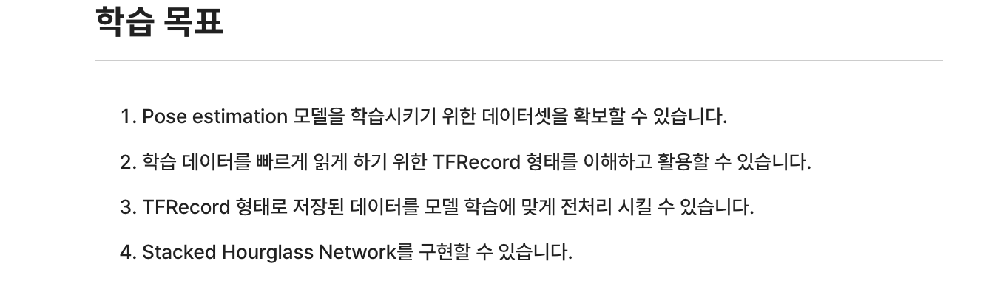

### 23-2. 데이터 전처리하기
앞으로 사용할 라이브러리를 불러옵니다. 고정해서 사용할 변수도 만들어 두죠.



In [8]:
# 주의! ray를 tensorflow보다 먼저 import하면 오류가 발생할 수 있습니다
import io, json, os, math

import tensorflow as tf
from tensorflow.keras.layers import Add, Concatenate, Lambda
from tensorflow.keras.layers import Input, Conv2D, ReLU, MaxPool2D
from tensorflow.keras.layers import UpSampling2D, ZeroPadding2D
from tensorflow.keras.layers import BatchNormalization
import ray

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

PROJECT_PATH = os.getenv('HOME') + '/aiffel/mpii'
IMAGE_PATH = os.path.join(PROJECT_PATH, 'images')
MODEL_PATH = os.path.join(PROJECT_PATH, 'models')
TFRECORD_PATH = os.path.join(PROJECT_PATH, 'tfrecords_mpii')
TRAIN_JSON = os.path.join(PROJECT_PATH, 'mpii_human_pose_v1_u12_2', 'train.json')
VALID_JSON = os.path.join(PROJECT_PATH, 'mpii_human_pose_v1_u12_2', 'validation.json')

print('슝=3')

슝=3


### json 파싱하기
#### 이전 스텝에서 train.json과 validation.json 파일이 소개된 것을 기억하시나요? 이 파일들은 이미지에 담겨 있는 사람들의 pose keypoint 정보들을 가지고 있어서 Pose Estimation을 위한 label로 삼을 수 있습니다.

우선 json이 어떻게 구성되어 있는지 파악해 보기 위해 json 파일을 열어 샘플로 annotation 정보를 1개만 출력해 봅시다. json.dumps()를 활용해서 좀 더 명확하게 하면 더욱 좋습니다.

In [9]:
with open(TRAIN_JSON) as train_json:
    train_annos = json.load(train_json) # JSON 파일의 내용을 Python 객체로 변환 -> train_annos**는 Python 리스트로 변환
    json_formatted_str = json.dumps(train_annos[0], indent=2)
    # json.dumps: Python 객체를 JSON 문자열로 변환
    # 리스트의 첫번째 요소를 가져옴. 여러 요소들일 수 있음
    # indent=2: 들여쓰기
    # 최종 문자열로 저장
    print(json_formatted_str)
'''
# JSON 파일은 일반적으로 텍스트 형식으로 저장된 데이터 구조(딕셔너리, 리스트 등)를 포함
	with문:
	•	파일을 열고, 작업이 끝난 후 자동으로 파일을 닫습니다. 파일 핸들링에서 안전하게 작업할 수 있는 방법입니다.
	•	train_json은 파일 객체로, 파일을 읽거나 쓸 때 사용됩니다
'''

{
  "joints_vis": [
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1
  ],
  "joints": [
    [
      620.0,
      394.0
    ],
    [
      616.0,
      269.0
    ],
    [
      573.0,
      185.0
    ],
    [
      647.0,
      188.0
    ],
    [
      661.0,
      221.0
    ],
    [
      656.0,
      231.0
    ],
    [
      610.0,
      187.0
    ],
    [
      647.0,
      176.0
    ],
    [
      637.0201,
      189.8183
    ],
    [
      695.9799,
      108.1817
    ],
    [
      606.0,
      217.0
    ],
    [
      553.0,
      161.0
    ],
    [
      601.0,
      167.0
    ],
    [
      692.0,
      185.0
    ],
    [
      693.0,
      240.0
    ],
    [
      688.0,
      313.0
    ]
  ],
  "image": "015601864.jpg",
  "scale": 3.021046,
  "center": [
    594.0,
    257.0
  ]
}


'\n# JSON 파일은 일반적으로 텍스트 형식으로 저장된 데이터 구조(딕셔너리, 리스트 등)를 포함\n\twith문:\n\t•\t파일을 열고, 작업이 끝난 후 자동으로 파일을 닫습니다. 파일 핸들링에서 안전하게 작업할 수 있는 방법입니다.\n\t•\ttrain_json은 파일 객체로, 파일을 읽거나 쓸 때 사용됩니다\n'

joints 가 우리가 label 로 사용할 keypoint 의 label 입니다.  
#### joints_vis는 keypoint의 가시성(visibility)을 나타내는 값
이미지 형상과 사람의 포즈에 따라 모든 label 이 이미지에 나타나지 않기 때문에 joints_vis 를 이용해서 실제로 사용할 수 있는 keypoint 인지 나타냅니다.  
MPII 의 경우 1 (visible) / 0(non) 으로만 나누어지기 때문에 조금 더 쉽게 사용할 수 있습니다.  
coco 의 경우 2 / 1 / 0 으로 표현해서 occlusion 상황까지 label 화 되어 있습니다.

	ㅁ MPII 데이터셋:
	•	1: 가시(visible)
	•	0: 비가시(non-visible)
	•	단순히 가시 여부만 확인 가능.
    
	ㅁ COCO 데이터셋:
	•	2: 보이는 keypoint (visible)
	•	1: 가려져 있지만 사용할 수 있는 keypoint (occluded)
	•	0: 비가시 (non-visible)
	•	COCO 데이터셋은 가려짐(occlusion)까지 레이블링하여 더 세부적인 정보를 제공합니다.


joints 순서는 아래와 같은 순서로 배치되어 저장해 뒀습니다.

    0 - 오른쪽 발목
    1 - 오른쪽 무릎
    2 - 오른쪽 엉덩이
    
    3 - 왼쪽 엉덩이
    4 - 왼쪽 무릎
    5 - 왼쪽 발목
    
    6 - 골반
    
    7 - 가슴(흉부)
    
    8 - 목
    9 - 머리 위
    
    10 - 오른쪽 손목
    11 - 오른쪽 팔꿈치
    12 - 오른쪽 어깨
    
    13 - 왼쪽 어깨
    14 - 왼쪽 팔꿈치
    15 - 왼쪽 손목
scale과 center는 사람 몸의 크기와 중심점 입니다.  
scale은 200을 곱해야 온전한 크기가 됩니다. 추후에 전처리 과정에서 200을 곱해서 사용할 예정이에요.

#### 이제 json annotation 을 파싱하는 함수를 만들어 보겠습니다.






In [10]:
# 이 함수는 주어진 하나의 annotation(주석 데이터)를 파싱(parsing)하여 정리된 사전(dictionary) 형태로 반환
def parse_one_annotation(anno, image_dir):
    # anno -> train_annos[0] : json파일에서 로드한, 주어진 이미지와 keypoint 정보를 포함한 단일 annotation 데이터
    # img_dir 이미지 저장경로
    filename = anno['image']
    joints = anno['joints']
    # joints: 이미지에 대한 keypoint 좌표 정보.
    joints_visibility = anno['joints_vis']
    # 각 keypoint의 가시성 정보
    annotation = { # 딕셔너리화
        'filename': filename,
        'filepath': os.path.join(image_dir, filename),
        'joints_visibility': joints_visibility,
        'joints': joints,
        'center': anno['center'],
        'scale' : anno['scale']
    }
    return annotation

print('슝=3')

슝=3


한 번 parse_one_annotation()함수를 테스트 해봅시다.






In [11]:
with open(TRAIN_JSON) as train_json:
    train_annos = json.load(train_json)
    test = parse_one_annotation(train_annos[0], IMAGE_PATH)
    print(test)

{'filename': '015601864.jpg', 'filepath': '/aiffel/aiffel/mpii/images/015601864.jpg', 'joints_visibility': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'joints': [[620.0, 394.0], [616.0, 269.0], [573.0, 185.0], [647.0, 188.0], [661.0, 221.0], [656.0, 231.0], [610.0, 187.0], [647.0, 176.0], [637.0201, 189.8183], [695.9799, 108.1817], [606.0, 217.0], [553.0, 161.0], [601.0, 167.0], [692.0, 185.0], [693.0, 240.0], [688.0, 313.0]], 'center': [594.0, 257.0], 'scale': 3.021046}


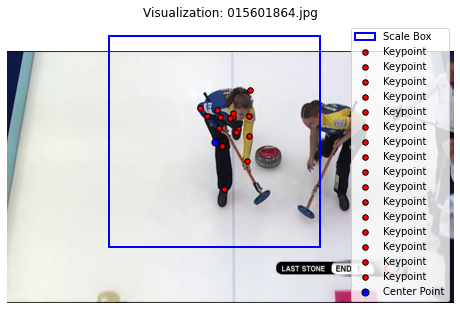

In [12]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2

def visualize_annotation(annotation):
    # 이미지 경로에서 읽어오기
    image = cv2.imread(annotation['filepath'])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # 키포인트와 중심점 정보 가져오기
    joints = annotation['joints']
    visibility = annotation['joints_visibility']
    center = annotation['center']
    scale = annotation['scale']

    # 이미지 시각화
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.title(f"Visualization: {annotation['filename']}")

    # 키포인트 시각화
    for joint, vis in zip(joints, visibility):
        x, y = joint
        if vis > 0:  # 가시성이 있는 경우에만 표시
            plt.scatter(x, y, c='red', s=30, label="Keypoint" if vis == 1 else "Occluded", edgecolors='black')

    # 중심점 표시
    plt.scatter(center[0], center[1], c='blue', s=50, label='Center Point', edgecolors='black')

    # 사람 크기를 나타내는 사각형 (scale)
    box_size = scale * 200
    rect = patches.Rectangle(
        (center[0] - box_size / 2, center[1] - box_size / 2),
        box_size,
        box_size,
        linewidth=2,
        edgecolor='blue',
        facecolor='none',
        label="Scale Box"
    )
    plt.gca().add_patch(rect)

    plt.legend()
    plt.axis('off')
    plt.show()


# TRAIN_JSON에서 첫 번째 annotation 시각화
with open(TRAIN_JSON) as train_json:
    train_annos = json.load(train_json)
    test = parse_one_annotation(train_annos[0], IMAGE_PATH)
    visualize_annotation(test)

이제 우리가 원하는 정보만 뽑아낼 수 있게 되었네요. 다음으로 넘어가보죠.

Q. MPII 데이터셋에서 json 파일에서 'scale' 정보가 의미하는 바는 무엇인가요?  
MPII 데이터셋에서 'scale'은 사람의 크기 비율을 나타내는데, 관절의 위치 및 사람의 신체 부분 크기를 상대적으로 표현하는 데 사용됩니다.  
일반적으로 관절의 좌표는 이미지의 크기에 따라 상대적으로 바뀌는 값이기 때문에 이를 보정하기 위해 scale 값을 제공하는 것이며, 이를 통해서 다른 크기의 이미지에서도 신체 부위의 위치를 일관성 있게 분석할 수 있습니다.





### 23-3. TFRecord 파일 만들기
TFRecord 파일 만들기  
이전까지는 tf.keras 의 ImageDataGenerator 를 이용해서 주로 학습 데이터를 읽었습니다. 하지만 실제 프로젝트에서는 튜토리얼 데이터셋보다 훨씬 큰 크기의 데이터를 다뤄야 합니다.  

    => ImageDataGenerator는 TensorFlow Keras에서 제공하는 데이터 전처리와 데이터 증강을 수행하는 유틸리티 클래스입니다. 주로 딥러닝 모델 학습 시 이미지 데이터를 실시간으로 변환(augmentation)하여 메모리 효율성을 높이고, 학습 데이터의 다양성을 증대시켜 모델의 일반화 성능을 향상시키는 데 사용됩니다.
    	•	모델 학습 시 fit 대신 fit_generator 또는 model.fit()에 train_generator를 전달합니다.
        •	model.fit(
                train_generator,
                epochs=10,
                steps_per_epoch=len(train_generator)
                )

학습을 많이 해볼수록 학습 속도에 관심을 가지게 되는데요. tensorflow 튜토리얼 문서에는 다음과 같은 표현으로 나타나 있습니다.

unless you are using tf.data and reading data is still the bottleneck to training.

일반적으로 학습 과정에서 gpu 의 연산 속도보다 HDD I/O 가 느리기 때문에 병목 현상이 발생하고 대단위 프로젝트 실험에서 효율성이 떨어지는 것을 관찰할 수 있습니다. (답답해요..)

따라서 "학습 데이터를 어떻게 빠르게 읽는가?" 에 대한 고민을 반드시 수행하셔야 더 많은 실험을 할 수 있습니다.

다음 링크를 보고 퀴즈를 풀어 봅시다.
https://www.tensorflow.org/guide/data_performance?hl=ko

### tf.data API로 성능 향상하기  
Q. 학습 속도를 향상시키기 위해서 데이터 관점에서 고려해야하는 단계는 어떤 단계인가요? 속도 향상을 위한 처리 방법을 위 링크에서 찾아대답해 봅시다.    
   => data read(또는 prefetch) 또는 데이터 변환 단계. gpu 학습과 병렬적으로 수행되도록 prefetch를 적용해야 함. 수행방법은 tf.data의 map 함수를 이용하고 cache 에 저장해두는 방법을 사용해야함.

    => 특히, 데이터 로딩 및 전처리 단계에서 병목현상이 발생할 수 있기 때문에 GPU/TPU 자원이 idle 상태로 대기하지 않도록 데이터 처리 속도를 최적화하는 것이 중요합니다.
    데이터 처리 단계
	1.	데이터 읽기 (Data Reading)
	•	데이터를 디스크에서 읽어오는 단계로, 일반적으로 가장 큰 병목현상이 발생.
	•	해결 방법:
	•	데이터셋을 한 번 읽어 cache에 저장하여 재사용.
	•	데이터를 병렬로 읽기.
	2.	데이터 변환 (Data Transformation)
	•	데이터 전처리 및 증강 작업을 수행.
	•	해결 방법:
	•	map 함수를 사용해 병렬 데이터 처리를 수행.
	•	GPU/TPU 학습과 병렬 처리를 통해 데이터 변환 시간을 단축.
	3.	Prefetch (사전 로딩)
	•	GPU 학습 단계와 데이터 준비 단계를 병렬화하여 모델 학습 중에도 데이터를 미리 준비.
	•	해결 방법:
	•	prefetch를 사용하여 다음 데이터를 미리 로드.


#### 내용이 꽤 어렵습니다만 tf 에서는 위 변환을 자동화해주는 도구를 제공합니다.   
#### 데이터셋을 TFRecord 형태로 표현하는 것인데요. TFRecord 는 binary record sequence 를 저장하기 위한 형식입니다.
    1. TFRecord란?
	•	TFRecord는 TensorFlow에서 제공하는 바이너리 파일 형식으로, 대규모 데이터셋을 저장하고 효율적으로 읽기 위해 설계되었습니다.
	•	바이너리 형식은 텍스트 형식보다 컴퓨터가 읽고 쓰는 데 훨씬 효율적이며, 딥러닝 모델 학습에 사용되는 대규모 데이터셋을 처리할 때 속도와 저장 공간 면에서 유리합니다.
    
    2. Protocol Buffer란?
	•	**Protocol Buffer (Protobuf)**는 구글에서 개발한 직렬화 데이터 형식 및 라이브러리입니다.
	•	데이터를 구조화된 형식으로 직렬화하여 저장하고, 크로스 플랫폼 간 데이터를 효율적으로 전송하거나 처리하는 데 사용됩니다.
	•	“직렬화”란?
	•	데이터를 저장하거나 전송 가능한 형태로 변환하는 것.
	•	데이터를 효율적으로 저장하거나 전송하기 위해 불필요한 정보는 제거하고 의미 있는 정보만 나열.
    
내부적으로 protocol buffer 라는 것을 이용합니다.

https://developers.google.com/protocol-buffers/?hl=ko
protocol buffer 는 크로스 플랫폼에서 사용할 수 있는 직렬화 데이터 라이브러리라고 생각하시면 됩니다.

데이터를 직렬화 한다는 것은 의미가 있는 정보만 추출해 나열하는 것을 뜻합니다. 예를 들어 "서울 강동구에 사는 32살 고길동"님을 나타내기 위해 "서울강동32고길동"과 같이 쓴다면 데이터만 담을 수 있겠죠? 다만 데이터 형식을 고정해야 하기 때문에 첫 두 글자는 시를 뜻하고, 다음 두 글자는 구를 뜻하고 다음 두 자리 숫자가 오고 이름은 세 글자여야 하는 제한이 생깁니다. 100살이 넘는 사람이나 이름이 세 글자가 아닌 사람을 담을 수 없어요. 그래서 매우 정형화된 데이터는 직렬화 하면 데이터 크기와 처리 속도 측면에서 유리하지만 사용하는데 제한이 있다고 기억하면 좋습니다. 어떤 데이터에서 어떤 방법으로 직렬화를 수행할지에 따라 발생되는 제한이 달라질 수도 있고요.

이제 구현을 시작하겠습니다. 하나하나 천천히 가보죠. 
#### 앞서 추출한 annotation을 TFRecord로 변환하는 함수를 만들게요.  
TFRecord 는 tf.train.Example들의 합으로 이루어지므로 하나의 annotation을 하나의 tf.train.Example로 만들어 주는 함수부터 작성합니다.







In [13]:
# 이 함수는 어노테이션 데이터를 TFRecord 형식으로 변환하여 TensorFlow 모델 학습에 사용할 수 있도록 준비.
def generate_tfexample(anno):

    # byte 인코딩을 위한 함수
    def _bytes_feature(value):
        if isinstance(value, type(tf.constant(0))):
            value = value.numpy()
        return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

    filename = anno['filename']
    filepath = anno['filepath']
    
    with open(filepath, 'rb') as image_file:
        content = image_file.read()
        #  이미지 파일을 바이너리 형식으로 읽어 변수 content에 저장.
    
    image = Image.open(filepath)
    if image.format != 'JPEG' or image.mode != 'RGB':
        image_rgb = image.convert('RGB')
        with io.BytesIO() as output:
            image_rgb.save(output, format="JPEG", quality=95)
            content = output.getvalue()
            # 변환된 이미지를 JPEG 형식으로 저장하고 content를 업데이트.

    width, height = image.size
    depth = 3 # 이미지 채널 수 

    c_x = int(anno['center'][0])
    c_y = int(anno['center'][1])
    scale = anno['scale']

    x = [
        int(joint[0]) if joint[0] >= 0 else int(joint[0]) 
        for joint in anno['joints']
    ]
    y = [
        int(joint[1]) if joint[1] >= 0 else int(joint[0]) 
        for joint in anno['joints']
    ]

    v = [0 if joint_v == 0 else 2 for joint_v in anno['joints_visibility']]
    # 가시성 데이터를 MPII 기준으로 0/2로 변환.
    # 0: 보이지 않는 키포인트 / 2: 보이는 키포인트.
    
    # TFRecord 형식 데이터 생성
    # TFRecord에 필요한 모든 데이터를 tf.train.Feature 형식으로 변환.
    feature = {
        'image/height':
        tf.train.Feature(int64_list=tf.train.Int64List(value=[height])),
        'image/width':
        tf.train.Feature(int64_list=tf.train.Int64List(value=[width])),
        'image/depth':
        tf.train.Feature(int64_list=tf.train.Int64List(value=[depth])),
        'image/object/parts/x':
        tf.train.Feature(int64_list=tf.train.Int64List(value=x)),
        'image/object/parts/y':
        tf.train.Feature(int64_list=tf.train.Int64List(value=y)),
        'image/object/center/x': 
        tf.train.Feature(int64_list=tf.train.Int64List(value=[c_x])),
        'image/object/center/y': 
        tf.train.Feature(int64_list=tf.train.Int64List(value=[c_y])),
        'image/object/scale':
        tf.train.Feature(float_list=tf.train.FloatList(value=[scale])),
        'image/object/parts/v':
        tf.train.Feature(int64_list=tf.train.Int64List(value=v)),
        'image/encoded':
        _bytes_feature(content),
        'image/filename':
        _bytes_feature(filename.encode())
    }

    return tf.train.Example(features=tf.train.Features(feature=feature))
    # 위에서 정의한 데이터를 tf.train.Example 객체로 변환하여 반환.
    
print('슝=3')

슝=3


하나의 annotation이 tf.train.Example이 되었다면 이제 여러 annotation에 대해 작업할 수 있도록 함수를 만들어야 합니다.

그런데 여기서 하나의 TFRecord를 만들지 않고 여러 TFRecord를 만들어 볼 거예요. 우선 얼마나 많은 TFRecord를 만들지 결정할 함수를 만들게요.






In [14]:
def chunkify(l, n):
    size = len(l) // n
    start = 0
    results = []
    for i in range(n):
        results.append(l[start:start + size])
        start += size
    return results

print('슝=3')

슝=3


이 함수는 전체 데이터를 몇 개의 그룹으로 나눌지 결정해 줍니다. 전체 데이터 l을 n그룹으로 나눕니다. 결과적으로 n개의 TFRecord 파일을 만들겠다는 이야기입니다.

여기서 좀 더 전문적으로는 n개로 shard 했다고 말합니다. 기업 단위의 데이터는 매우 크고 여러 장비에 나누어져 있기 때문에 sharding은 자주 이루어 집니다. 하나의 큰 데이터를 여러 개의 파일로 쪼개고 여러 컴퓨터에 나누어 담는 것이라고 여기면 됩니다. 이렇게 하면 데이터 저장에도 용이하고 병렬 처리에 하는데 이점이 있습니다.

이 때, 이 데이터는 원래 하나의 큰 데이터였기 때문에 저장 후 어떻게 사용할 것인가에 따라서 sharding 전략이 달라지는데요. 그 내용을 다루기에는 너무 방대하니 여기서는 간단히만 다룹니다. 모델을 학습하는데 각 파일의 크기와 개수만 고려해보면, 너무 작은 파일로 많이 나누는 것도, 너무 큰 파일로 적게 나누는 것도 좋지 않습니다. 너무 작은 파일로 많이 나누면 학습 중간에 너무 잦은 입출력이 요구되고, 너무 큰 파일로 적게 나누면 입출력마다 걸리는 시간이 길어집니다. 입출력에 걸리는 시간이 GPU의 계산 시간보다 길어지면 그만큼 손해가 됩니다. 적절한 파일 크기와 개수는 케바케라고 할 수 있어요.

아래 링크를 보고 퀴즈를 풀어 봅시다.

TFRecord 및 tf.train.Example

### Q. annotation 을 왜 shard 로 나눠야할까요? 위 링크를 참고해서 대답해 봅시다.  
I/O 병목을 피하기 위해 입력 파일을 여러개로 나눈 뒤, 병렬적으로 prefetch 하는 것이 학습 속도를 빠르게 합니다. 튜토리얼에서는 경험상 데이터를 읽는 호스트보다 최소 10 배 많은 파일을 보유하는 것이 좋습니다. 동시에 각 파일은 I / O 프리 페치의 이점을 누릴 수 있도록 충분히 커야합니다 (최소 10MB 이상, 이상적으로는 100MB 이상) 이라고 친절하게 사용 팁을 알려주고 있습니다.

    => 	•	데이터가 한 번에 큰 파일로 저장되어 있다면, 이를 읽고 전처리하는 동안 학습이 지연될 수 있음.
	•	Shard를 사용하면?
	•	데이터를 여러 조각으로 나누고 병렬적으로 읽을 수 있음.
	•	TensorFlow의 tf.data API는 prefetch와 같은 병렬 처리를 지원하여 여러 Shard를 동시에 처리.
	•	병렬 처리를 통해 I/O 병목 문제를 완화하고, 학습 속도를 향상시킬 수 있음.
    
    => 	•	예: 10개의 Shard가 있다면, 10개의 스레드가 동시에 데이터를 읽고 전처리 가능.
    
    •	TensorFlow의 tf.data.Dataset API는 Shard로 나뉜 데이터를 효율적으로 처리할 수 있도록 설계.
	•	Dataset.shard() 메서드를 사용하여 데이터 조각을 병렬로 로드 가능.
	•	**Dataset.prefetch()**를 통해 데이터 로딩과 학습 작업을 비동기적으로 수행하여 속도 향상.
#### 설명은 어렵지만 실행해보면 단순합니다. 그럼 chunkify함수를 테스트 해볼까요?






In [15]:
# 주어진 리스트를 **n개의 동일한 크기(chunk)**로 나누는 함수
test_chunks = chunkify([0] * 1000, 64)
# 길이가 1000인 리스트 [0, 0, ..., 0]를 64개의 조각으로 나눔. = 64개 만듦
# 각 조각의 크기는 1000 // 64 = 15. = 64개 각각의 크기가 15(15개의 0으로 구성된 리스트)
print(test_chunks)
print(len(test_chunks)) # 64개 조각(덩어리)
print(len(test_chunks[0])) # 크기 15 확인.
'''
def chunkify(l, n):
    size = len(l) // n
    start = 0
    results = []
    for i in range(n):
        results.append(l[start:start + size])
        start += size
    return results

print('슝=3')
'''

[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0,

"\ndef chunkify(l, n):\n    size = len(l) // n\n    start = 0\n    results = []\n    for i in range(n):\n        results.append(l[start:start + size])\n        start += size\n    return results\n\nprint('슝=3')\n"

0이 1000개 들어 있는 리스트가 64개로 쪼개졌네요. chunkify 함수를 테스트 해봤으니 하나의 chunk를 TFRecord로 만들어 줄 함수를 만듭시다.






In [16]:
@ray.remote
# 이 코드는 Ray를 이용해 병렬로 TFRecord 파일을 생성하는 작업을 수행하는 함수입니다. 각 데이터 조각(chunk)을 병렬로 처리하여 TFRecord 파일을 생성함으로써 속도를 높일 수 있습니다.
# @ray.remote는 병렬 처리를 쉽게 구현할 수 있는 라이브러리. 이 함수가 분산 환경에서 병렬로 실행 가능하도록 설정.

def build_single_tfrecord(chunk, path):
    # chunk : 변환해야할 조각 / path : TFrecord 저장경로
    print('start to build tf records for ' + path)

    with tf.io.TFRecordWriter(path) as writer:
        # TensorFlow의 TFRecordWriter를 사용하여 TFRecord 파일을 path경로에 생성
        for anno in chunk:
        # 데이터 조각(chunk)에 포함된 각 annotation(라벨)을 TFRecord 형식으로 변환:
            tf_example = generate_tfexample(anno)
            # generate_tfexample(anno)를 호출하여 tf.train.Example 객체 생성.
            # 사전에 generate_tfexample 함수 만들어 둔것 사용
            writer.write(tf_example.SerializeToString())
            # .SerializeToString()을 사용하여 직렬화된 문자열로 변환.
            # writer.write()를 통해 TFRecord 파일에 저장.

    print('finished building tf records for ' + path)

print('슝=3')

슝=3


#### chunk안에는 여러 annotation들이 있고, annotation들은 tf.train.Example로 변환된 후에 문자열로 직렬화되어 TFRecord에 담기는군요.

#### 또 한 가지 주의해서 봐야할 것은 함수 정의 위에 @ray.remote가 있다는 점이예요.

### RAY
Ray는 병렬 처리를 위한 라이브러리인데요. 파이썬에서 기본적으로 제공하는 multiprocessing 패키지보다 편하게 다양한 환경에서 사용할 수 있습니다.

이제 모든 준비가 되었으니 전체 데이터를 적당한 수의 TFRecord 파일로 만들어주는 함수를 만듭시다. ray를 사용하기 때문에 함수를 호출하는 문법이 약간 다르다는 점에 주의하세요.






In [17]:
def build_tf_records(annotations, total_shards, split):
    # split: 데이터의 타입(예: train, val, test 등).
    chunks = chunkify(annotations, total_shards)
    futures = [
        build_single_tfrecord.remote(
            chunk, '{}/{}_{}_of_{}.tfrecords'.format(
                TFRECORD_PATH,
                split,
                str(i + 1).zfill(4),
                str(total_shards).zfill(4),
                # TFRECORD_PATH/split_i_of_total_shards.tfrecords 꼴로 저장
            )) for i, chunk in enumerate(chunks) # 리스트 컴프리헨션 형태 -> for문을 뒤로배치
    ]
    ray.get(futures) # ray.get을 사용하여 모든 병렬 작업이 완료될 때까지 기다림.

print('슝=3')

슝=3


함수는 모두 준비되었습니다. 이제 다음으로 넘어가 함수를 실행할 차례입니다.



### 23-4. Ray
앞서 작성한 함수를 사용해 데이터를 TFRecord로 만들어 줍니다. train 데이터는 64개로, val 데이터는 8개의 파일로 만듭니다. 시간이 꽤 걸립니다.






In [18]:
num_train_shards = 64
num_val_shards = 8

ray.init()

print('Start to parse annotations.')
if not os.path.exists(TFRECORD_PATH):
    os.makedirs(TFRECORD_PATH)

with open(TRAIN_JSON) as train_json:
    train_annos = json.load(train_json)
    train_annotations = [
        parse_one_annotation(anno, IMAGE_PATH)
        for anno in train_annos
    ]
    print('First train annotation: ', train_annotations[0])

with open(VALID_JSON) as val_json:
    val_annos = json.load(val_json)
    val_annotations = [
        parse_one_annotation(anno, IMAGE_PATH) 
        for anno in val_annos
    ]
    print('First val annotation: ', val_annotations[0])
    
print('Start to build TF Records.')
build_tf_records(train_annotations, num_train_shards, 'train')
build_tf_records(val_annotations, num_val_shards, 'val')

print('Successfully wrote {} annotations to TF Records.'.format(
    len(train_annotations) + len(val_annotations)))

2025-01-03 07:59:40,261	WARNING services.py:1729 -- WARNING: The object store is using /tmp instead of /dev/shm because /dev/shm has only 67108864 bytes available. This will harm performance! You may be able to free up space by deleting files in /dev/shm. If you are inside a Docker container, you can increase /dev/shm size by passing '--shm-size=2.99gb' to 'docker run' (or add it to the run_options list in a Ray cluster config). Make sure to set this to more than 30% of available RAM.


Start to parse annotations.
First train annotation:  {'filename': '015601864.jpg', 'filepath': '/aiffel/aiffel/mpii/images/015601864.jpg', 'joints_visibility': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'joints': [[620.0, 394.0], [616.0, 269.0], [573.0, 185.0], [647.0, 188.0], [661.0, 221.0], [656.0, 231.0], [610.0, 187.0], [647.0, 176.0], [637.0201, 189.8183], [695.9799, 108.1817], [606.0, 217.0], [553.0, 161.0], [601.0, 167.0], [692.0, 185.0], [693.0, 240.0], [688.0, 313.0]], 'center': [594.0, 257.0], 'scale': 3.021046}
First val annotation:  {'filename': '005808361.jpg', 'filepath': '/aiffel/aiffel/mpii/images/005808361.jpg', 'joints_visibility': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], 'joints': [[804.0, 711.0], [816.0, 510.0], [908.0, 438.0], [1040.0, 454.0], [906.0, 528.0], [883.0, 707.0], [974.0, 446.0], [985.0, 253.0], [982.7591, 235.9694], [962.2409, 80.0306], [869.0, 214.0], [798.0, 340.0], [902.0, 253.0], [1067.0, 253.0], [1167.0, 353.0], [1142.0, 478.0]], 'c

TFRecord 파일이 만들어지는 동안 Ray에 대해서 더 알아봅시다.

What is Ray?
위 자료에 주어진 예시 코드를 보면 ray를 사용하는 방법이 보입니다.
"""
import ray
ray.init()

@ray.remote
def f(x):
    return x * x

futures = [f.remote(i) for i in range(4)]
print(ray.get(futures)) # [0, 1, 4, 9]

@ray.remote
class Counter(object):
    def __init__(self):
        self.n = 0

    def increment(self):
        self.n += 1

    def read(self):
        return self.n

counters = [Counter.remote() for i in range(4)]
[c.increment.remote() for c in counters]
futures = [c.read.remote() for c in counters]
print(ray.get(futures)) # [1, 1, 1, 1]
"""


함수나 클래스에 @ray.remote 데코레이터를 붙이고 some_function.remote()형식으로 함수를 만들어 냅니다. 클래스의 경우에는 메서드를 호출할 때 remote()를 이용하네요. 함수나 메서드는 이 시점에 실행되는 것이 아니라 생성만 됩니다. 그리고 ray.get()을 통해 실행이 되는 구조입니다. 함수를 바로 호출하는 것이 아니라 작업으로써 생성만 해놓고 나중에 실행한다는 점에 주의하세요.

아래 링크를 참고해서 퀴즈를 풀어 봅시다.

Multiprocessing없이 Python 10배 가속화하기 – Ray 로 병렬처리
https://modulabs.co.kr/blog/ray-multiprocessing-python

### Q. multiprocessing 과 ray 의 사용상 차이점은 무엇인가요? 위 링크를 참고해서 대답해 봅시다.  

#### MP 는 병렬화를 위해 추상적 구조를 새로 설계해야 하지만 ray 는 쓰던 코드에서 거의 수정 없이 병렬화 할 수 있는 장점이 있습니다.



### 23-5. data label 로 만들기
TFRecord로 저장된 데이터를 모델 학습에 필요한 데이터로 바꿔줄 함수가 필요합니다. tensorflow에서 이미 제공해주는 함수를 사용하면 되기 때문에 간단합니다. 
#### 주의할 점은 TFRecord가 직렬화된 데이터이기 때문에 만들 때 데이터 순서와 읽어올 때 데이터 순서가 같아야 한다는 점이에요. 데이터의 형식도 동일하게 맞춰 줘야 합니다.






In [19]:
def parse_tfexample(example):
    image_feature_description = {
        'image/height': tf.io.FixedLenFeature([], tf.int64),
        'image/width': tf.io.FixedLenFeature([], tf.int64),
        'image/depth': tf.io.FixedLenFeature([], tf.int64),
        'image/object/parts/x': tf.io.VarLenFeature(tf.int64),
        'image/object/parts/y': tf.io.VarLenFeature(tf.int64),
        'image/object/parts/v': tf.io.VarLenFeature(tf.int64),
        'image/object/center/x': tf.io.FixedLenFeature([], tf.int64),
        'image/object/center/y': tf.io.FixedLenFeature([], tf.int64),
        'image/object/scale': tf.io.FixedLenFeature([], tf.float32),
        'image/encoded': tf.io.FixedLenFeature([], tf.string),
        'image/filename': tf.io.FixedLenFeature([], tf.string),
    }
    return tf.io.parse_single_example(example, image_feature_description)

print('슝=3')

슝=3


이렇게 얻은 image 와 label 을 이용해서 적절한 학습 형태로 변환합니다. 이미지를 그대로 사용하지 않고 적당히 정사각형으로 crop하여 사용합니다.

우리가 알고 있는 것은 joints 의 위치, center 의 좌표, body height 값입니다. 균일하게 학습하기 위해 body width 를 적절히 정하는 것도 중요합니다. 
#### 이와 관련해서는 여러 방법이 있을 수 있겠지만 배우는 단계에서 더 중요하게 봐야 할 부분은 우리가 임의로 조정한 crop box 가 이미지 바깥으로 나가지 않는지 예외 처리를 잘 해주어야 한다는 점입니다.






In [20]:
def crop_roi(image, features, margin=0.2):
    img_shape = tf.shape(image)
    img_height = img_shape[0]
    img_width = img_shape[1]
    img_depth = img_shape[2]

    keypoint_x = tf.cast(tf.sparse.to_dense(features['image/object/parts/x']), dtype=tf.int32)
    keypoint_y = tf.cast(tf.sparse.to_dense(features['image/object/parts/y']), dtype=tf.int32)
    center_x = features['image/object/center/x']
    center_y = features['image/object/center/y']
    body_height = features['image/object/scale'] * 200.0

    # keypoint 중 유효한값(visible = 1) 만 사용합니다.
    masked_keypoint_x = tf.boolean_mask(keypoint_x, keypoint_x > 0)
    masked_keypoint_y = tf.boolean_mask(keypoint_y, keypoint_y > 0)
    # tf.boolean_mask는 조건을 만족하는 값만 반환합니다.
    
    # min, max 값을 찾습니다.
    keypoint_xmin = tf.reduce_min(masked_keypoint_x)
    keypoint_xmax = tf.reduce_max(masked_keypoint_x)
    keypoint_ymin = tf.reduce_min(masked_keypoint_y)
    keypoint_ymax = tf.reduce_max(masked_keypoint_y)

    # 높이 값을 이용해서 x, y 위치를 재조정 합니다. 박스를 정사각형으로 사용하기 위해 아래와 같이 사용합니다.
    # 기본값 0.2로 설정되어 키포인트 크기의 20%만큼 여백을 추가.
    # 키포인트의 x 좌표가 [30, 100]이라면, body_height=50일 때 margin=0.2로 여백이 10만큼 추가되어 [20, 110]로 확장됩니다.
    xmin = keypoint_xmin - tf.cast(body_height * margin, dtype=tf.int32)
    xmax = keypoint_xmax + tf.cast(body_height * margin, dtype=tf.int32)
    ymin = keypoint_ymin - tf.cast(body_height * margin, dtype=tf.int32)
    ymax = keypoint_ymax + tf.cast(body_height * margin, dtype=tf.int32)

    # 이미지 크기를 벗어나는 점을 재조정 해줍니다.
    # effective_xmin, effective_ymin: 확장된 좌표가 0보다 작아지지 않도록 보정.
	# effective_xmax, effective_ymax: 확장된 좌표가 이미지 크기를 초과하지 않도록 제한.
    effective_xmin = xmin if xmin > 0 else 0
    effective_ymin = ymin if ymin > 0 else 0
    effective_xmax = xmax if xmax < img_width else img_width
    effective_ymax = ymax if ymax < img_height else img_height
    effective_height = effective_ymax - effective_ymin
    effective_width = effective_xmax - effective_xmin

    image = image[effective_ymin:effective_ymax, effective_xmin:effective_xmax, :]
    new_shape = tf.shape(image)
    new_height = new_shape[0]
    new_width = new_shape[1]

    effective_keypoint_x = (keypoint_x - effective_xmin) / new_width
    effective_keypoint_y = (keypoint_y - effective_ymin) / new_height
    # 크롭된 이미지에서의 키포인트 정규화
    
    return image, effective_keypoint_x, effective_keypoint_y

print('슝=3')

슝=3(build_single_tfrecord pid=1287) finished building tf records for /aiffel/aiffel/mpii/tfrecords_mpii/val_0008_of_0008.tfrecords



#### (x, y) 좌표로 되어있는 keypoint 를 heatmap 으로 변경시킵니다. 하나의 점에만 표시 되어있는 정보를 좌표 근처 여러 지점에 확률 분포 형태로 학습시키면 결과가 더 좋았던 점을 떠올려 주세요. 이런 확률 분표 형태의 정보를 heatmap이라고 부릅니다.

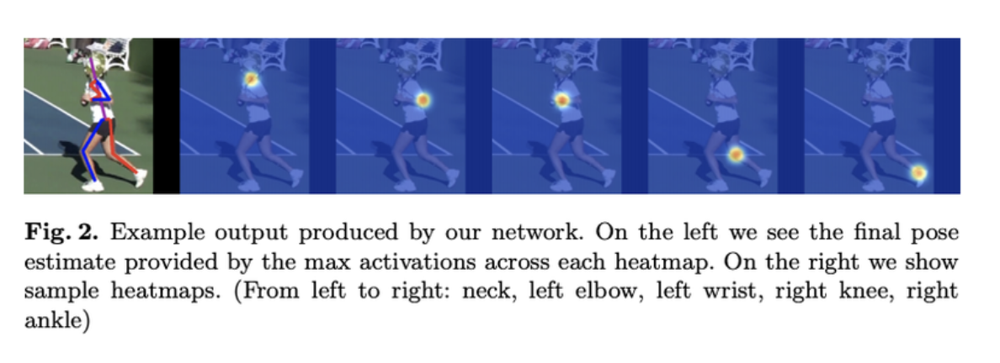

확률 분포로는 2차원 가우시안 분포를 사용합니다.
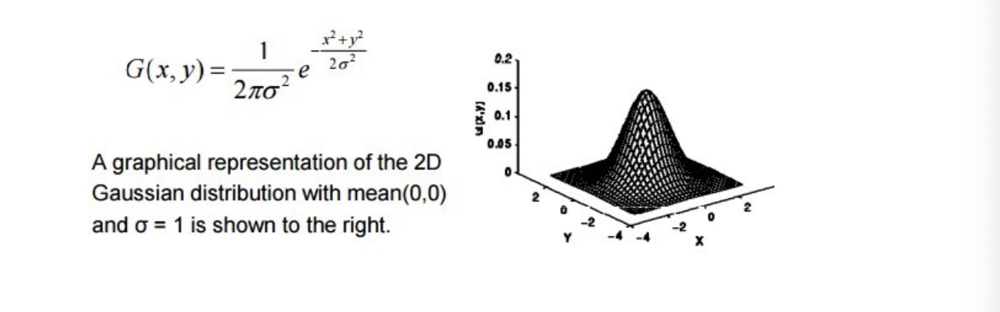
content img
Q. 2차원 가우시안 분포의 확률 밀도 함수는 어떤 형태를 가지나요?  
 2차원 가우시안 분포의 확률 밀도 함수는 타원 형태를 가지며, 중심을 기준으로 좌우 대칭입니다. 즉, 확률이 가장 높은 지점은 평균값 주변이며, 그래프에서 멀어질수록 확률이 감소합니다.







In [21]:
def generate_2d_guassian(height, width, y0, x0, visibility=2, sigma=1, scale=12):
    heatmap = tf.zeros((height, width))

    xmin = x0 - 3 * sigma
    ymin = y0 - 3 * sigma
    xmax = x0 + 3 * sigma
    ymax = y0 + 3 * sigma
    
    if xmin >= width or ymin >= height or xmax < 0 or ymax < 0 or visibility == 0:
        return heatmap

    size = 6 * sigma + 1
    x, y = tf.meshgrid(tf.range(0, 6 * sigma + 1, 1), tf.range(0, 6 * sigma + 1, 1), indexing='xy')

    center_x = size // 2
    center_y = size // 2

    gaussian_patch = tf.cast(tf.math.exp(
        -(tf.math.square(x - center_x) + tf.math.square(y - center_y)) / (tf.math.square(sigma) * 2)) * scale,
                             dtype=tf.float32)

    patch_xmin = tf.math.maximum(0, -xmin)
    patch_ymin = tf.math.maximum(0, -ymin)
    patch_xmax = tf.math.minimum(xmax, width) - xmin
    patch_ymax = tf.math.minimum(ymax, height) - ymin

    heatmap_xmin = tf.math.maximum(0, xmin)
    heatmap_ymin = tf.math.maximum(0, ymin)
    heatmap_xmax = tf.math.minimum(xmax, width)
    heatmap_ymax = tf.math.minimum(ymax, height)

    indices = tf.TensorArray(tf.int32, 1, dynamic_size=True)
    updates = tf.TensorArray(tf.float32, 1, dynamic_size=True)

    count = 0

    for j in tf.range(patch_ymin, patch_ymax):
        for i in tf.range(patch_xmin, patch_xmax):
            indices = indices.write(count, [heatmap_ymin + j, heatmap_xmin + i])
            updates = updates.write(count, gaussian_patch[j][i])
            count += 1

    heatmap = tf.tensor_scatter_nd_update(heatmap, indices.stack(), updates.stack())

    return heatmap

def make_heatmaps(features, keypoint_x, keypoint_y, heatmap_shape):
    v = tf.cast(tf.sparse.to_dense(features['image/object/parts/v']), dtype=tf.float32)
    x = tf.cast(tf.math.round(keypoint_x * heatmap_shape[0]), dtype=tf.int32)
    y = tf.cast(tf.math.round(keypoint_y * heatmap_shape[1]), dtype=tf.int32)

    num_heatmap = heatmap_shape[2]
    heatmap_array = tf.TensorArray(tf.float32, 16)

    for i in range(num_heatmap):
        gaussian = self.generate_2d_guassian(heatmap_shape[1], heatmap_shape[0], y[i], x[i], v[i])
        heatmap_array = heatmap_array.write(i, gaussian)

    heatmaps = heatmap_array.stack()
    heatmaps = tf.transpose(heatmaps, perm=[1, 2, 0])  # change to (64, 64, 16)

    return heatmaps

print('슝=3')

슝=3


지금까지 만든 함수들을 개별 함수로도 만들 수 있지만 객체 형태로 조합해 볼게요. 객체 형태로 만들면 선언부는 복잡해 보여도 훨씬 장점이 많습니다. 함수에서 객체의 메서드로 수정할 때는 self를 추가해야 하는 점을 잊지 마세요!






In [22]:
class Preprocessor(object):
    def __init__(self,
                 image_shape=(256, 256, 3),
                 heatmap_shape=(64, 64, 16),
                 is_train=False):
        self.is_train = is_train
        self.image_shape = image_shape
        self.heatmap_shape = heatmap_shape

    def __call__(self, example):
        features = self.parse_tfexample(example)
        image = tf.io.decode_jpeg(features['image/encoded'])

        if self.is_train:
            random_margin = tf.random.uniform([1], 0.1, 0.3)[0]
            image, keypoint_x, keypoint_y = self.crop_roi(image, features, margin=random_margin)
            image = tf.image.resize(image, self.image_shape[0:2])
        else:
            image, keypoint_x, keypoint_y = self.crop_roi(image, features)
            image = tf.image.resize(image, self.image_shape[0:2])

        image = tf.cast(image, tf.float32) / 127.5 - 1
        heatmaps = self.make_heatmaps(features, keypoint_x, keypoint_y, self.heatmap_shape)

        return image, heatmaps

        
    def crop_roi(self, image, features, margin=0.2):
        img_shape = tf.shape(image)
        img_height = img_shape[0]
        img_width = img_shape[1]
        img_depth = img_shape[2]

        keypoint_x = tf.cast(tf.sparse.to_dense(features['image/object/parts/x']), dtype=tf.int32)
        keypoint_y = tf.cast(tf.sparse.to_dense(features['image/object/parts/y']), dtype=tf.int32)
        center_x = features['image/object/center/x']
        center_y = features['image/object/center/y']
        body_height = features['image/object/scale'] * 200.0
        
        masked_keypoint_x = tf.boolean_mask(keypoint_x, keypoint_x > 0)
        masked_keypoint_y = tf.boolean_mask(keypoint_y, keypoint_y > 0)
        
        keypoint_xmin = tf.reduce_min(masked_keypoint_x)
        keypoint_xmax = tf.reduce_max(masked_keypoint_x)
        keypoint_ymin = tf.reduce_min(masked_keypoint_y)
        keypoint_ymax = tf.reduce_max(masked_keypoint_y)
        
        xmin = keypoint_xmin - tf.cast(body_height * margin, dtype=tf.int32)
        xmax = keypoint_xmax + tf.cast(body_height * margin, dtype=tf.int32)
        ymin = keypoint_ymin - tf.cast(body_height * margin, dtype=tf.int32)
        ymax = keypoint_ymax + tf.cast(body_height * margin, dtype=tf.int32)
        
        effective_xmin = xmin if xmin > 0 else 0
        effective_ymin = ymin if ymin > 0 else 0
        effective_xmax = xmax if xmax < img_width else img_width
        effective_ymax = ymax if ymax < img_height else img_height
        effective_height = effective_ymax - effective_ymin
        effective_width = effective_xmax - effective_xmin

        image = image[effective_ymin:effective_ymax, effective_xmin:effective_xmax, :]
        new_shape = tf.shape(image)
        new_height = new_shape[0]
        new_width = new_shape[1]
        
        effective_keypoint_x = (keypoint_x - effective_xmin) / new_width
        effective_keypoint_y = (keypoint_y - effective_ymin) / new_height
        
        return image, effective_keypoint_x, effective_keypoint_y
        
    
    def generate_2d_guassian(self, height, width, y0, x0, visibility=2, sigma=1, scale=12):
        
        heatmap = tf.zeros((height, width))

        xmin = x0 - 3 * sigma
        ymin = y0 - 3 * sigma
        xmax = x0 + 3 * sigma
        ymax = y0 + 3 * sigma

        if xmin >= width or ymin >= height or xmax < 0 or ymax <0 or visibility == 0:
            return heatmap

        size = 6 * sigma + 1
        x, y = tf.meshgrid(tf.range(0, 6*sigma+1, 1), tf.range(0, 6*sigma+1, 1), indexing='xy')

        center_x = size // 2
        center_y = size // 2

        gaussian_patch = tf.cast(tf.math.exp(-(tf.square(x - center_x) + tf.math.square(y - center_y)) / (tf.math.square(sigma) * 2)) * scale, dtype=tf.float32)

        patch_xmin = tf.math.maximum(0, -xmin)
        patch_ymin = tf.math.maximum(0, -ymin)
        patch_xmax = tf.math.minimum(xmax, width) - xmin
        patch_ymax = tf.math.minimum(ymax, height) - ymin

        heatmap_xmin = tf.math.maximum(0, xmin)
        heatmap_ymin = tf.math.maximum(0, ymin)
        heatmap_xmax = tf.math.minimum(xmax, width)
        heatmap_ymax = tf.math.minimum(ymax, height)

        indices = tf.TensorArray(tf.int32, 1, dynamic_size=True)
        updates = tf.TensorArray(tf.float32, 1, dynamic_size=True)

        count = 0

        for j in tf.range(patch_ymin, patch_ymax):
            for i in tf.range(patch_xmin, patch_xmax):
                indices = indices.write(count, [heatmap_ymin+j, heatmap_xmin+i])
                updates = updates.write(count, gaussian_patch[j][i])
                count += 1
                
        heatmap = tf.tensor_scatter_nd_update(heatmap, indices.stack(), updates.stack())

        return heatmap


    def make_heatmaps(self, features, keypoint_x, keypoint_y, heatmap_shape):
        v = tf.cast(tf.sparse.to_dense(features['image/object/parts/v']), dtype=tf.float32)
        x = tf.cast(tf.math.round(keypoint_x * heatmap_shape[0]), dtype=tf.int32)
        y = tf.cast(tf.math.round(keypoint_y * heatmap_shape[1]), dtype=tf.int32)
        
        num_heatmap = heatmap_shape[2]
        heatmap_array = tf.TensorArray(tf.float32, 16)

        for i in range(num_heatmap):
            gaussian = self.generate_2d_guassian(heatmap_shape[1], heatmap_shape[0], y[i], x[i], v[i])
            heatmap_array = heatmap_array.write(i, gaussian)
        
        heatmaps = heatmap_array.stack()
        heatmaps = tf.transpose(heatmaps, perm=[1, 2, 0]) # change to (64, 64, 16)
        
        return heatmaps

    def parse_tfexample(self, example):
        image_feature_description = {
            'image/height': tf.io.FixedLenFeature([], tf.int64),
            'image/width': tf.io.FixedLenFeature([], tf.int64),
            'image/depth': tf.io.FixedLenFeature([], tf.int64),
            'image/object/parts/x': tf.io.VarLenFeature(tf.int64),
            'image/object/parts/y': tf.io.VarLenFeature(tf.int64),
            'image/object/parts/v': tf.io.VarLenFeature(tf.int64),
            'image/object/center/x': tf.io.FixedLenFeature([], tf.int64),
            'image/object/center/y': tf.io.FixedLenFeature([], tf.int64),
            'image/object/scale': tf.io.FixedLenFeature([], tf.float32),
            'image/encoded': tf.io.FixedLenFeature([], tf.string),
            'image/filename': tf.io.FixedLenFeature([], tf.string),
        }
        return tf.io.parse_single_example(example,
                                          image_feature_description)

print('슝=3')

슝=3


이제 데이터 전처리가 완료되었으니 모델을 만들러 가봅시다.



### 23-6. 모델을 학습해보자
Hourglass 모델 만들기
이전 살펴봤던 hourglass 모델, 잘 기억하고 계신가요?
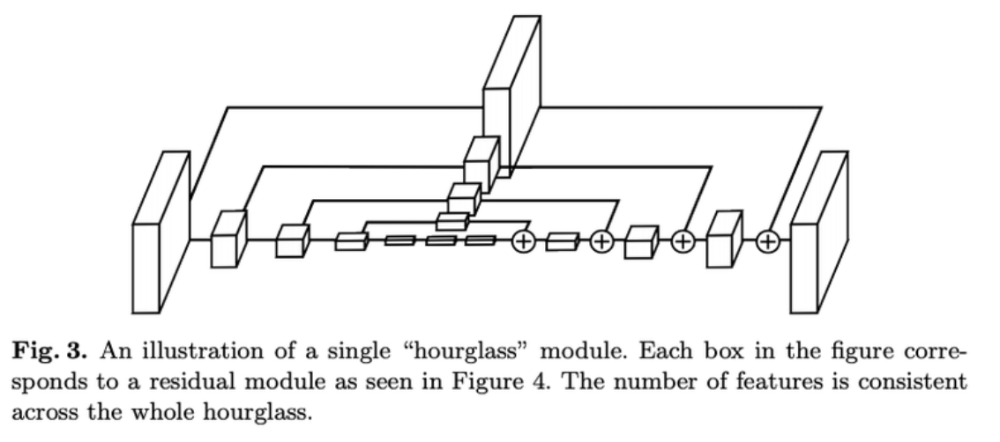

이렇게 생겼었죠! 직육면체 박스는 residual block 이었습니다. 하나씩 구현해 볼게요.






In [23]:
def BottleneckBlock(inputs, filters, strides=1, downsample=False, name=None):
    identity = inputs
    
    if downsample:
        identity = Conv2D(
            filters=filters,
            kernel_size=1,
            strides=strides,
            padding='same',
            kernel_initializer='he_normal')(inputs)

    x = BatchNormalization(momentum=0.9)(inputs)
    x = ReLU()(x)
    x = Conv2D(
        filters=filters // 2,
        kernel_size=1,
        strides=1,
        padding='same',
        kernel_initializer='he_normal')(x)

    x = BatchNormalization(momentum=0.9)(x)
    x = ReLU()(x)
    x = Conv2D(
        filters=filters // 2,
        kernel_size=3,
        strides=strides,
        padding='same',
        kernel_initializer='he_normal')(x)

    x = BatchNormalization(momentum=0.9)(x)
    x = ReLU()(x)
    x = Conv2D(
        filters=filters,
        kernel_size=1,
        strides=1,
        padding='same',
        kernel_initializer='he_normal')(x)

    x = Add()([identity, x])
    return x

print('슝=3')

슝=3


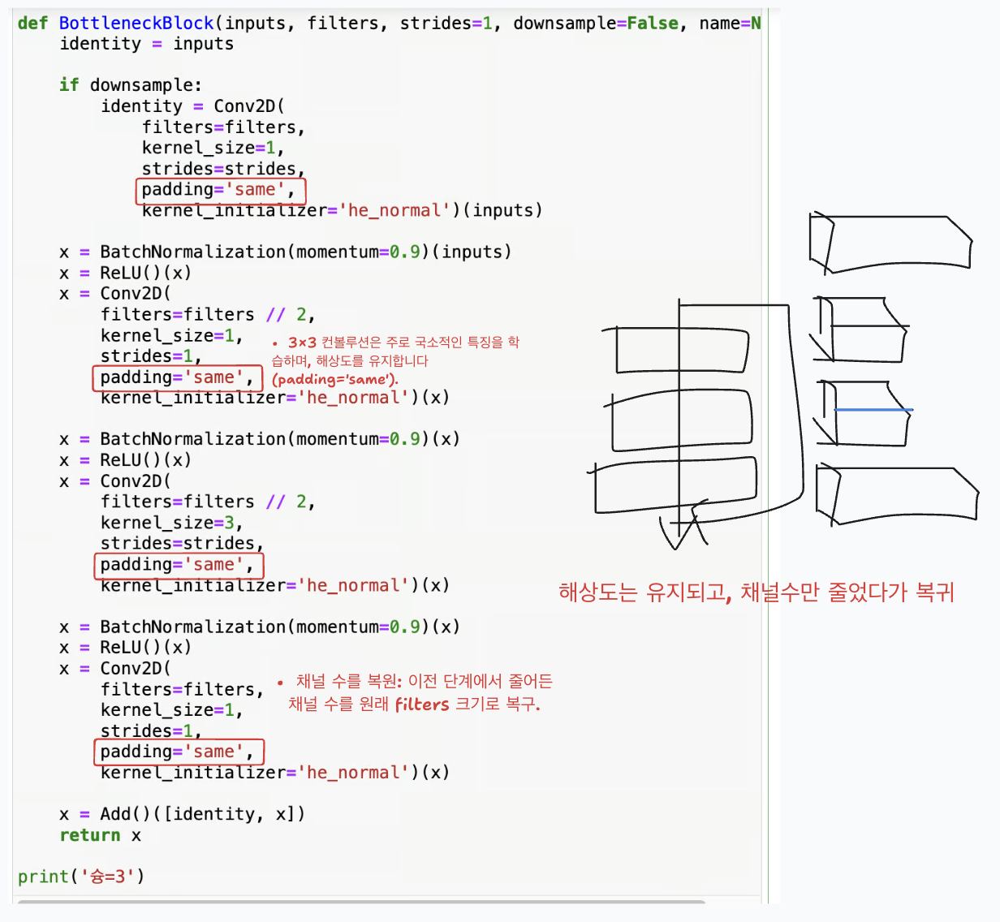

Q. residual block 의 2가지 타입을 간단하게 작성해주세요. (N사 면접기출)  
    => 3x3-3x3 basic block, 1x1-3x3-1x1 bottleneck block  
    => Resnet 기억하기  
    
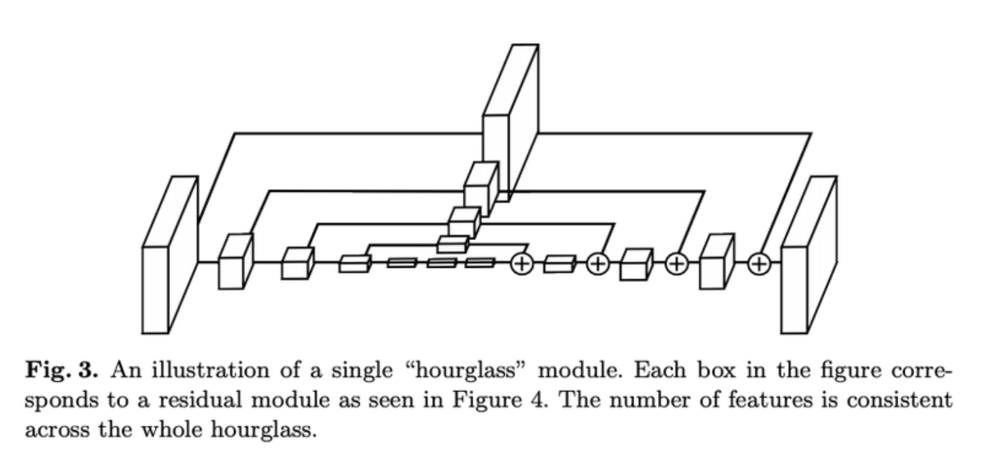

다시 돌아와서 hourglass 모델을 잘 생각해 보면 마치 양파처럼 가장 바깥의 layer 를 제거하면 똑같은 구조가 나타나는 것을 알 수 있습니다. 이 점을 이용해서 간단하게 모델을 표현할 수 있는데요.

바로 재귀 함수를 이용하는 것이겠죠! 바깥부터 5개의 양파껍질(층)을 만들고 싶다면 order 를 이용해서 5,4...1 이 될 때까지 HourglassModule 을 반복하면 order 가 1이 되면 BottleneckBlock 으로 대체해 주면 아주 간결하게 만들 수 있습니다.






In [24]:
def HourglassModule(inputs, order, filters, num_residual):
    # Order: 모델의 반복 깊이. order가 1이 될때 재귀 호출 
    
    up1 = BottleneckBlock(inputs, filters, downsample=False)
    for i in range(num_residual):
        up1 = BottleneckBlock(up1, filters, downsample=False)
    # up =>  상단 경로, 잔차블록으로 처리 => 다운샘플링
    # num_residual 수만큼 블록 쌓기, 최종 고해상도 피쳐맵 추출
        
        
    low1 = MaxPool2D(pool_size=2, strides=2)(inputs)
    # 입력텐서 해상도를 2배 축소
    for i in range(num_residual):
        low1 = BottleneckBlock(low1, filters, downsample=False)

    low2 = low1
    if order > 1:
        low2 = HourglassModule(low1, order - 1, filters, num_residual)
    else:
        for i in range(num_residual):
            low2 = BottleneckBlock(low2, filters, downsample=False)

    low3 = low2
    for i in range(num_residual):
        low3 = BottleneckBlock(low3, filters, downsample=False)

    up2 = UpSampling2D(size=2)(low3)

    return up2 + up1

print('슝=3')

슝=3


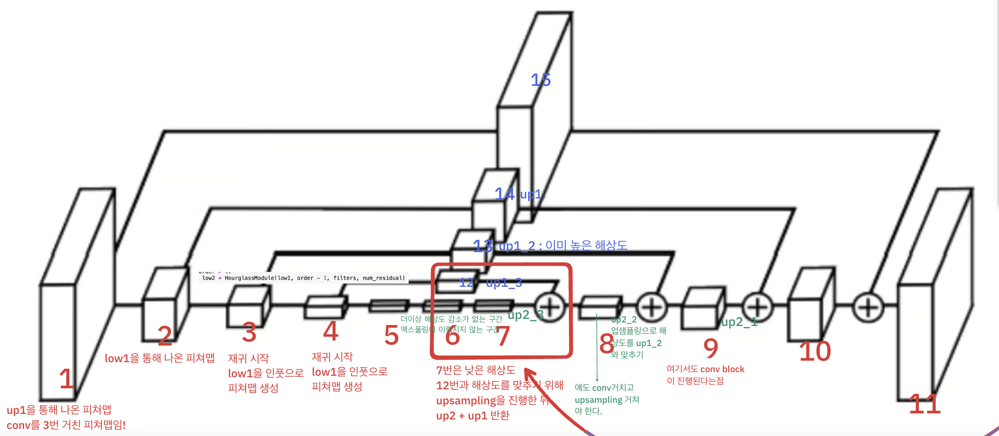
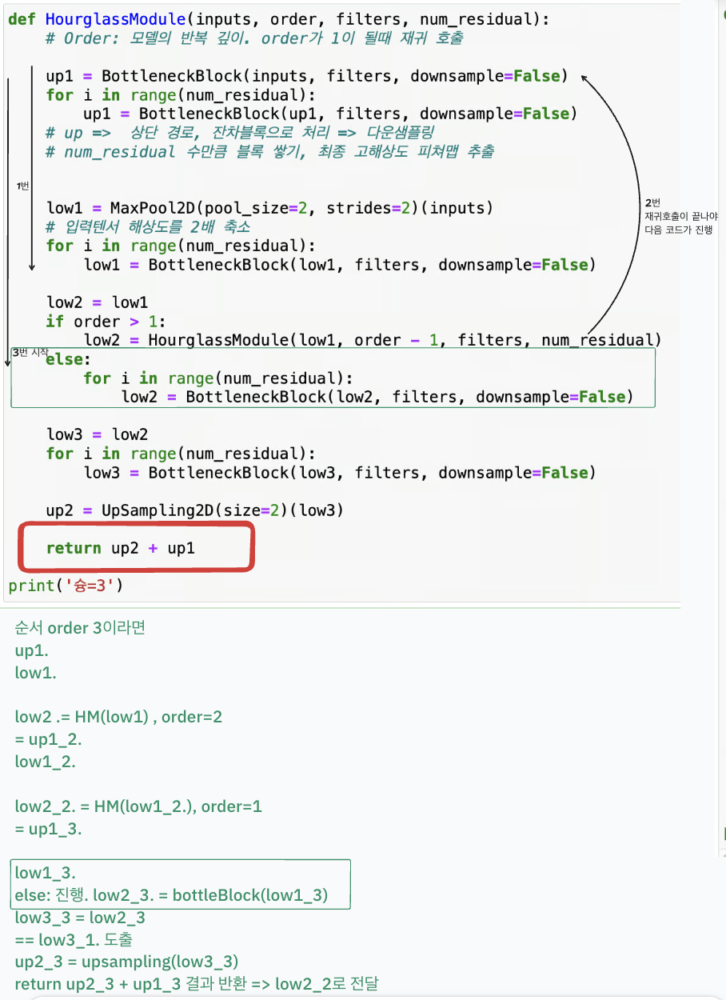


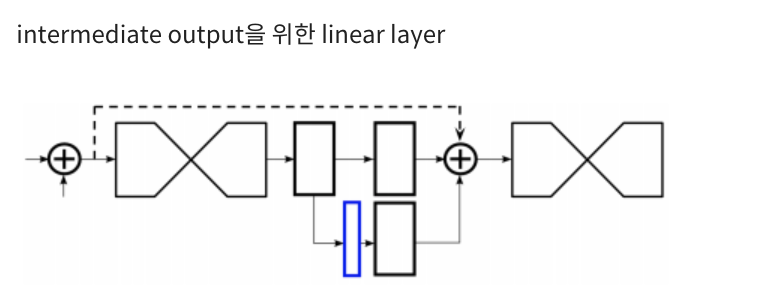
여러 모듈을 쌓을수록 모델이 깊어지는 만큼 학습이 어려워, 저자들은 Intermediate supervision을 적용하였습니다.
도식에서 보이는 모듈 사이의 네트워크의 파란 박스는 모델 중간에 계산되는 히트맵 결과를 출력하는 convolution layer입니다. 이 히트맵과 ground truth의 차이를 intermediate loss (auxilary loss) 로 계산합니다. 이로써 stacked hourglass module은 보다 정교한 결과를 도출해냅니다.
Intermediate supervision의 효능이 더 궁금하다면, 다음의 포스트를 읽어보세요!
Stacked Hourglass Networks : pose estimation 논문

Stacked hourglass 모듈이 총 4개라면, 한 번의 학습에 몇 번의 loss가 계산될까요?  
모듈이 총 4개라면, 3번의 intermediate loss와 최종 결과까지 총 4번의 loss가 계산됩니다.







In [25]:
def LinearLayer(inputs, filters):
    x = Conv2D(
        filters=filters,
        kernel_size=1,
        strides=1,
        padding='same',
        kernel_initializer='he_normal')(inputs)
    x = BatchNormalization(momentum=0.9)(x)
    x = ReLU()(x)
    return x

print('슝=3')

슝=3


따라서 stacked 되는 hourglass 층 사이사이에 LinearLayer 를 삽입하고 중간 loss 를 계산해 줍니다.

지금까지 만든 hourglass 를 여러 층으로 쌓으면 stacked hourglass 가 됩니다.
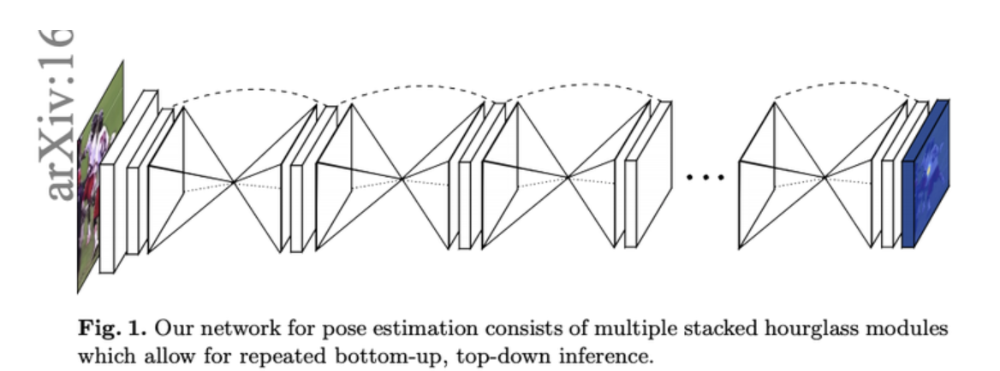


In [26]:
def StackedHourglassNetwork(
        input_shape=(256, 256, 3), 
        num_stack=4, 
        num_residual=1,
        num_heatmap=16):
    
    inputs = Input(shape=input_shape)

    x = Conv2D(
        filters=64,
        kernel_size=7,
        strides=2,
        padding='same',
        kernel_initializer='he_normal')(inputs)
    x = BatchNormalization(momentum=0.9)(x)
    x = ReLU()(x)
    x = BottleneckBlock(x, 128, downsample=True)
    x = MaxPool2D(pool_size=2, strides=2)(x)
    x = BottleneckBlock(x, 128, downsample=False)
    x = BottleneckBlock(x, 256, downsample=True)

    ys = []
    for i in range(num_stack):
        x = HourglassModule(x, order=4, filters=256, num_residual=num_residual)
        for i in range(num_residual):
            x = BottleneckBlock(x, 256, downsample=False)

        x = LinearLayer(x, 256)

        y = Conv2D(
            filters=num_heatmap,
            kernel_size=1,
            strides=1,
            padding='same',
            kernel_initializer='he_normal')(x)
        ys.append(y)

        if i < num_stack - 1:
            y_intermediate_1 = Conv2D(filters=256, kernel_size=1, strides=1)(x)
            y_intermediate_2 = Conv2D(filters=256, kernel_size=1, strides=1)(y)
            x = Add()([y_intermediate_1, y_intermediate_2])

    return tf.keras.Model(inputs, ys, name='stacked_hourglass')

print('슝=3')

슝=3


이제 StackedHourglassNetwork만 이용하면 모델을 쉽게 만들 수 있습니다.



### 23-7. 학습 엔진 만들기
### GPU가 여러 개인 환경
이제 모델 학습을 진행할 차례입니다.

그런데 학습을 할 수 있는 GPU가 여러 개이고 데이터를 병렬로 학습시키려면 어떻게 해야할까요? 여러 GPU를 사용하기 위해서는 약간의 코드를 추가해줘야 합니다. 
#### 학습 환경은 GPU가 하나이지만 나중에 기업 환경에서 여러 GPU를 사용할 수 있으니 살짝 공부해 봅시다.

Distributed training with Keras
https://www.tensorflow.org/tutorials/distribute/keras?hl=ko  

#### 가장 핵심 키워드는 tf.distribute.MirroredStrategy입니다. 한 컴퓨터에 GPU가 여러 개인 경우 사용할 수 있는 방법인데요. 여러 GPU가 모델을 학습한 후 각각의 Loss를 계산하면 CPU가 전체 Loss를 종합합니다. 그런 후 모델의 가중치를 업데이트 하도록 하는 것이죠.

각 GPU에서 계산한 Loss를 토대로 전체 Loss를 종합해주는 역할은 strategy.reduce 함수가 담당합니다.

이번에도 각 함수를 별개로 만들지 않고 하나의 객체로 만들어 봅니다.






In [27]:
# class Trainer(object):
#     def __init__(self,
#                  model,
#                  epochs,
#                  global_batch_size,
#                  strategy,
#                  initial_learning_rate):
#         self.model = model
#         self.epochs = epochs
#         self.strategy = strategy
#         self.global_batch_size = global_batch_size
#         self.loss_object = tf.keras.losses.MeanSquaredError(
#             reduction=tf.keras.losses.Reduction.NONE)
#         self.optimizer = tf.keras.optimizers.Adam(
#             learning_rate=initial_learning_rate)
#         self.model = model

#         self.current_learning_rate = initial_learning_rate
#         self.last_val_loss = math.inf
#         self.lowest_val_loss = math.inf
#         self.patience_count = 0
#         self.max_patience = 10
#         self.best_model = None

#     def lr_decay(self):
#         if self.patience_count >= self.max_patience:
#             self.current_learning_rate /= 10.0
#             self.patience_count = 0
#         elif self.last_val_loss == self.lowest_val_loss:
#             self.patience_count = 0
#         self.patience_count += 1

#         self.optimizer.learning_rate = self.current_learning_rate

#     def lr_decay_step(self, epoch):
#         if epoch == 25 or epoch == 50 or epoch == 75:
#             self.current_learning_rate /= 10.0
#         self.optimizer.learning_rate = self.current_learning_rate

#     def compute_loss(self, labels, outputs):
#         loss = 0
#         for output in outputs:
#             weights = tf.cast(labels > 0, dtype=tf.float32) * 81 + 1
#             loss += tf.math.reduce_mean(
#                 tf.math.square(labels - output) * weights) * (
#                     1. / self.global_batch_size)
#         return loss

#     def train_step(self, inputs):
#         images, labels = inputs
#         with tf.GradientTape() as tape:
#             outputs = self.model(images, training=True)
#             loss = self.compute_loss(labels, outputs)

#         grads = tape.gradient(
#             target=loss, sources=self.model.trainable_variables)
#         self.optimizer.apply_gradients(
#             zip(grads, self.model.trainable_variables))

#         return loss

#     def val_step(self, inputs):
#         images, labels = inputs
#         outputs = self.model(images, training=False)
#         loss = self.compute_loss(labels, outputs)
#         return loss

#     def run(self, train_dist_dataset, val_dist_dataset):
#         @tf.function
#         def distributed_train_epoch(dataset):
#             tf.print('Start distributed traininng...')
#             total_loss = 0.0
#             num_train_batches = 0.0
#             for one_batch in dataset:
#                 per_replica_loss = self.strategy.run(
#                     self.train_step, args=(one_batch, ))
#                 batch_loss = self.strategy.reduce(
#                     tf.distribute.ReduceOp.SUM, per_replica_loss, axis=None)
#                 total_loss += batch_loss
#                 num_train_batches += 1
#                 tf.print('Trained batch', num_train_batches, 'batch loss',
#                          batch_loss, 'epoch total loss', total_loss / num_train_batches)
#             return total_loss, num_train_batches

#         @tf.function
#         def distributed_val_epoch(dataset):
#             total_loss = 0.0
#             num_val_batches = 0.0
#             for one_batch in dataset:
#                 per_replica_loss = self.strategy.run(
#                     self.val_step, args=(one_batch, ))
#                 num_val_batches += 1
#                 batch_loss = self.strategy.reduce(
#                     tf.distribute.ReduceOp.SUM, per_replica_loss, axis=None)
#                 tf.print('Validated batch', num_val_batches, 'batch loss',
#                          batch_loss)
#                 if not tf.math.is_nan(batch_loss):
#                     # TODO: Find out why the last validation batch loss become NaN
#                     total_loss += batch_loss
#                 else:
#                     num_val_batches -= 1

#             return total_loss, num_val_batches

#         for epoch in range(1, self.epochs + 1):
#             self.lr_decay()
#             print('Start epoch {} with learning rate {}'.format(
#                 epoch, self.current_learning_rate))

#             train_total_loss, num_train_batches = distributed_train_epoch(
#                 train_dist_dataset)
#             train_loss = train_total_loss / num_train_batches
#             print('Epoch {} train loss {}'.format(epoch, train_loss))

#             val_total_loss, num_val_batches = distributed_val_epoch(
#                 val_dist_dataset)
#             val_loss = val_total_loss / num_val_batches
#             print('Epoch {} val loss {}'.format(epoch, val_loss))

#             # save model when reach a new lowest validation loss
#             if val_loss < self.lowest_val_loss:
#                 self.save_model(epoch, val_loss)
#                 self.lowest_val_loss = val_loss
#             self.last_val_loss = val_loss

#         return self.best_model

#     def save_model(self, epoch, loss):
#         model_name = MODEL_PATH + '/model-epoch-{}-loss-{:.4f}.h5'.format(epoch, loss)
#         self.model.save_weights(model_name)
#         self.best_model = model_name
#         print("Model {} saved.".format(model_name))

# print('슝=3')
# '''
#         trainer = Trainer(
#             model,
#             epochs,
#             global_batch_size,
#             strategy,
#             initial_learning_rate=learning_rate)
# '''

Q. tf.distribute.MirroredStrategy외에 Tensorflow의 GPU 분산 훈련을 위한 전략 메소드는 또 무엇이 있는지 알아볼까요?  

MirroredStrategy : TensorFlow에서 다중 GPU 환경에서 모델을 훈련하기 위한 분산 전략

TPUStrategy : 구글의 Tensor Processing Units(TPU)를 사용하여 모델을 훈련하기 위한 분산 전략

MultiWorkerMirroredStrategy : 다중 워커(worker) 환경에서 모델을 훈련하기 위한 분산 전략

ParameterServerStrategy : 다중 서버(server) 환경에서 모델을 훈련하기 위한 분산 전략

CentralStorageStrategy : 중앙 저장소를 사용하여 모델을 훈련하기 위한 분산 전략

등이 있습니다.


#### 이제 데이터셋을 만드는 함수를 작성합니다. TFRecord 파일이 여러개이므로 tf.data.Dataset.list_files를 통해 불러옵니다.






In [28]:
# IMAGE_SHAPE = (256, 256, 3)
# HEATMAP_SIZE = (64, 64)

# def create_dataset(tfrecords, batch_size, num_heatmap, is_train):
#     preprocess = Preprocessor(
#         IMAGE_SHAPE, (HEATMAP_SIZE[0], HEATMAP_SIZE[1], num_heatmap), is_train)

#     dataset = tf.data.Dataset.list_files(tfrecords)
#     dataset = tf.data.TFRecordDataset(dataset)
#     dataset = dataset.map(
#         preprocess, num_parallel_calls=tf.data.experimental.AUTOTUNE)

#     if is_train:
#         dataset = dataset.shuffle(batch_size)

#     dataset = dataset.batch(batch_size)
#     dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

#     return dataset

# print('슝=3')

이제 데이터셋과 모델, 훈련용 객체를 조립만하면 되겠군요. 하나의 함수로 만들어 줄 텐데요. 주의할 점은 with strategy.scope():부분이 반드시 필요하다는 점이에요.

Custom training with tf.distribute.Strategy
또 데이터셋도 experimental_distribute_dataset를 통해 연결해 줘야 한다는 것도 중요해요.






In [29]:
# def train(epochs, learning_rate, num_heatmap, batch_size, train_tfrecords, val_tfrecords):
#     strategy = tf.distribute.MirroredStrategy()
#     # tf.distribute.MirroredStrategy: GPU 또는 TPU와 같은 여러 디바이스에 동일한 모델을 복제하여 병렬적으로 학습을 수행하는 데이터 병렬 처리 전략입니다.
#     # 학습 가속화
#     global_batch_size = strategy.num_replicas_in_sync * batch_size
#     # strategy.num_replicas_in_sync:  사용 중인 디바이스(GPU 등)의 개수를 반환합니다.
#     # 글로벌 배치 크기는 각 디바이스에서 사용되는 로컬 배치 크기의 총합으로 정의
#     # 예: 2개의 GPU를 사용할 경우, 각 GPU에서 batch_size=32이면 global_batch_size = 64
#     train_dataset = create_dataset(
#         train_tfrecords, global_batch_size, num_heatmap, is_train=True)
#     val_dataset = create_dataset(
#         val_tfrecords, global_batch_size, num_heatmap, is_train=False)
#     # create_dataset 함수는 TFRecord 파일로부터 데이터를 읽어와 TensorFlow 데이터셋으로 변환
#     # is_train: 학습/검증 모드 구분.
    
#     if not os.path.exists(MODEL_PATH):
#         os.makedirs(MODEL_PATH)

#     with strategy.scope():
#     # strategy.scope() 내에서 모델과 데이터셋을 정의해야 합니다.
#     # 이 블록 내에서 정의된 모든 변수는 분산 학습에 적합하도록 자동으로 관리
#         train_dist_dataset = strategy.experimental_distribute_dataset(
#             train_dataset)
#         val_dist_dataset = strategy.experimental_distribute_dataset(
#             val_dataset)
#         # experimental_distribute_dataset:
#         # 데이터셋을 분산 학습 전략에 따라 나눕니다.
#         # 디바이스 수만큼 데이터가 나누어 각 디바이스에서 독립적으로 처리됩니다.
        
#         model = StackedHourglassNetwork(IMAGE_SHAPE, 4, 1, num_heatmap)
#         # 입력 이미지의 크기(IMAGE_SHAPE), 스택 개수(4), 잔차 블록 개수(1), 히트맵 개수(num_heatmap)
        
#         trainer = Trainer( # 훈련을 관리하는 객체
#             model,
#             epochs,
#             global_batch_size,
#             strategy,
#             initial_learning_rate=learning_rate)

#         print('Start training...')
#         return trainer.run(train_dist_dataset, val_dist_dataset)
#         # trainer.run : 학습 및 검증 데이터를 사용하여 모델을 학습시
#         # 최종적으로 훈련된 모델을 반환
# print('슝=3')

이제 꽤 어려웠던 모든 준비가 끝났군요. 
### 모델을 학습시킬 차례입니다. 
학습에는 오랜 시간이 걸리기 때문에 여기서는 동작하는 코드만 확인해봅시다. (1 Epoch 학습에만 1 시간 가까이 소요됩니다.😮)



In [30]:
# train_tfrecords = os.path.join(TFRECORD_PATH, 'train*')
# val_tfrecords = os.path.join(TFRECORD_PATH, 'val*')
# epochs = 1
# batch_size = 16
# num_heatmap = 16
# learning_rate = 0.0007

# best_model_file = train(epochs, learning_rate, num_heatmap, batch_size, train_tfrecords, val_tfrecords)


### 23-8. 둠칫둠칫 댄스타임
예측 엔진 만들기
이제 학습이 끝난 모델이 얼마나 잘 예측하는지 확인해 볼 시간입니다. 미리 학습된 모델을 불러옵시다.






In [31]:
os.environ["HDF5_USE_FILE_LOCKING"] = "FALSE"
# 디버깅 -> 파일 잠금 비활성화 전, 하단 코드가 실행되지 않음
# OSError: Unable to open file (unable to lock file, errno = 37, error message = 'No locks available')

'''
HDF5 파일 잠금을 비활성화하면 문제를 해결할 수 있습니다. 
환경 변수를 설정하여 파일 잠금을 무시하도록 설정할 수 있습니다:
'''

'\nHDF5 파일 잠금을 비활성화하면 문제를 해결할 수 있습니다. \n환경 변수를 설정하여 파일 잠금을 무시하도록 설정할 수 있습니다:\n'

In [32]:
# WEIGHTS_PATH = os.path.join(PROJECT_PATH, 'models', 'model-v0.0.1-epoch-2-loss-1.3072.h5')

# model = StackedHourglassNetwork(IMAGE_SHAPE, 4, 1)
# model.load_weights(WEIGHTS_PATH)

# # 이전의 학습하는 코드 블럭을 통해 학습하고 그 모델을 사용할 경우 아래 주석 처리된 코드를 사용하면 됩니다
# # model.load_weights(best_model_file)

학습에 사용했던 keypoint 들을 사용해야 하기 때문에 필요한 변수를 지정해 줍니다. 변수에 저장되는 것은 해당 부위를 나타내는 인덱스예요.






In [33]:
R_ANKLE = 0
R_KNEE = 1
R_HIP = 2

L_HIP = 3
L_KNEE = 4
L_ANKLE = 5

PELVIS = 6
THORAX = 7
UPPER_NECK = 8
HEAD_TOP = 9

R_WRIST = 10
R_ELBOW = 11
R_SHOULDER = 12

L_SHOULDER = 13
L_ELBOW = 14
L_WRIST = 15

MPII_BONES = [
    [R_ANKLE, R_KNEE],
    [R_KNEE, R_HIP],
    [R_HIP, PELVIS],
    [L_HIP, PELVIS],
    [L_HIP, L_KNEE],
    [L_KNEE, L_ANKLE],
    [PELVIS, THORAX],
    [THORAX, UPPER_NECK],
    [UPPER_NECK, HEAD_TOP],
    [R_WRIST, R_ELBOW],
    [R_ELBOW, R_SHOULDER],
    [THORAX, R_SHOULDER],
    [THORAX, L_SHOULDER],
    [L_SHOULDER, L_ELBOW],
    [L_ELBOW, L_WRIST]
]

print('슝=3')

슝=3


모델을 학습할 때 라벨이 되는 좌표를 heatmap으로 바꿨던 것이 기억 나시나요?   
학습을 heatmap으로 했기 때문에 모델이 추론해 내놓은 결과도 heatmap입니다.   
#### 그래서 이 heatmap으로부터 좌표를 추출해야해요.   
heatmap중에 최대값을 갖는 지점을 찾아내면 되겠네요.   
heatmap에서 최대값을 찾는 함수를 만들어 줍니다.






In [34]:
def find_max_coordinates(heatmaps):
    #  heatmaps는 TensorFlow 텐서 (h,w,c=16)
    flatten_heatmaps = tf.reshape(heatmaps, (-1, 16))
    # 입력 heatmaps를 평탄화하여 (height * width, channels) 형태로 변환
    # 각 keypoint 채널에 대해 모든 픽셀 값을 1차원으로 나열
    
    indices = tf.math.argmax(flatten_heatmaps, axis=0)
    # 각 채널(column)에서 최대값을 가지는 인덱스를 찾습니다.
    
    y = tf.cast(indices / 64, dtype=tf.int64)
    # indices는 height * width의 1차원 배열에서 인덱스를 나타내므로, y 좌표는 indices를 이미지 너비(64)로 나눈 몫
    x = indices - 64 * y
    
    return tf.stack([x, y], axis=1).numpy()
    # x, y 좌표를 하나의 배열로 결합합니다.
    # 각 keypoint 채널에 대해 (x, y) 좌표를 반환
    
'''
flatten_heatmaps 구조: 각 keypoint 채널마다 4096개의 픽셀 값이 나열된 (4096, 16) 텐서.
axis=0: column(4096개의 픽셀 값)에서 최대값의 인덱스를 계산!!! 최대값이 아니라. 그 최대값의 위치! 인덱스!!
예: [123, 850, 2345, ...] → 각 값은 1차원 배열에서 해당 keypoint의 최대값 위치!!


•indices는 1차원 배열의 위치이므로, 이를 (height, width) 좌표로 변환해야 합니다.
•y 좌표는 전체 배열(4096)을 이미지 너비(64)로 나눈 몫입니다.
•indices // 64는 행(row, y)의 번호를 구하는 과정.
•예:
indices = [123, 850, 2345] → y = [123 // 64, 850 // 64, 2345 // 64] 
=> 최종 y 좌표 = [1, 13, 36]
   
indices = [123, 850, 2345], y = [1, 13, 36]
x = [123 - 64 * 1, 850 - 64 * 13, 2345 - 64 * 36] 
=> 최종 x 좌표 = [59, 18, 41]
예시 x,y = (18,13)
최종 x는 850의 위치에서 y좌표는 850//64 = 13.xxx -> 64*13칸 자체를 빼버리면! 0.xx에 해당하는 x좌표가 나오는거다.
그래서 850 - 64 * 13 를 활용하여 x 값을 구하는 것!!
'''

'\nflatten_heatmaps 구조: 각 keypoint 채널마다 4096개의 픽셀 값이 나열된 (4096, 16) 텐서.\naxis=0: column(4096개의 픽셀 값)에서 최대값의 인덱스를 계산!!! 최대값이 아니라. 그 최대값의 위치! 인덱스!!\n예: [123, 850, 2345, ...] → 각 값은 1차원 배열에서 해당 keypoint의 최대값 위치!!\n\n\n•indices는 1차원 배열의 위치이므로, 이를 (height, width) 좌표로 변환해야 합니다.\n•y 좌표는 전체 배열(4096)을 이미지 너비(64)로 나눈 몫입니다.\n•indices // 64는 행(row, y)의 번호를 구하는 과정.\n•예:\nindices = [123, 850, 2345] → y = [123 // 64, 850 // 64, 2345 // 64] \n=> 최종 y 좌표 = [1, 13, 36]\n   \nindices = [123, 850, 2345], y = [1, 13, 36]\nx = [123 - 64 * 1, 850 - 64 * 13, 2345 - 64 * 36] \n=> 최종 x 좌표 = [59, 18, 41]\n예시 x,y = (18,13)\n최종 x는 850의 위치에서 y좌표는 850//64 = 13.xxx -> 64*13칸 자체를 빼버리면! 0.xx에 해당하는 x좌표가 나오는거다.\n그래서 850 - 64 * 13 를 활용하여 x 값을 구하는 것!!\n'

위 함수만으로는 256x256 이미지에 64x64 heatmap max 값을 표현할 때 quantization 오차가 발생하기 때문에 실제 계산에서는 3x3 필터를 이용해서 근사치를 구해줍니다.

## 여기부터




In [35]:
def extract_keypoints_from_heatmap(heatmaps):
    max_keypoints = find_max_coordinates(heatmaps)
    # heatsmap : 각 값은 해당 위치에서 keypoint의 확률값을 나타냅니다.
    # 각 heatmap의 최대값 위치 (x, y)를 찾아서 반환
    
    padded_heatmap = np.pad(heatmaps, [[1,1],[1,1],[0,0]], mode='constant')
    # np.pad(array, pad_width, mode, **kwargs)
    # array:패딩 추가할 원본 배열, pad width: 패딩크기 지정하는 튜플이나 리스트. 각 축에 대해 추가할 값의 수를 정의
    # 즉 [1,1],[1,1],[0,0]] 즉 H, W 축에 대해서만 각각 앞과 뒤에 1픽셀씩 추가, 채널축에대해선 패딩을 안한다는 뜻
    # 주변 픽셀을 고려하기 위해 heatmap을 1픽셀씩 패딩.
    # 상하좌우 1픽셀 추가되는 결과.
    
    # keypoint 좌표에 대해 조정 작업 시작
    adjusted_keypoints = []
    for i, keypoint in enumerate(max_keypoints):
        # keypoint: 최대값의 좌표 (x, y)., i:keypoint 채널 인덱스
        max_y = keypoint[1]+1
        max_x = keypoint[0]+1
        # 패딩으로 위,좌측이 1씩 추가되어있기 때문에 -> 중심좌표 좌표를 보정
        
        patch = padded_heatmap[max_y-1:max_y+2, max_x-1:max_x+2, i]
        '''
        •	좌표 조정: 패딩이 추가되었으므로 기존 좌표에 +1.
        •	3x3 패치 추출: 중심 픽셀을 기준으로 주변 3x3 영역 선택.
        •	max_y-1:max_y+2와 max_x-1:max_x+2로 선택.
        •	패치 크기: (3, 3).
        '''
        patch[1][1] = 0 # 중심값 제거
        # 이유: 중심값(최대값)은 이미 선택되었으므로 제외.
        # 나머지 8개 픽셀 중에서 가장 큰 값을 찾기 위한 준비 작업.
        
        # 3x3 패치에서 새로운 최대값 좌표 계산
        index = np.argmax(patch)
        
        next_y = index // 3 # 3x3 배열을 1D로 변환하여 최대값의 1D 인덱스 반환. / 똑같은 처리 반복
        next_x = index - next_y * 3
        
        delta_y = (next_y - 1) / 4
        delta_x = (next_x - 1) / 4
        # next_y - 1: 중심 픽셀(1,1)을 기준으로 이동량 계산, / 4: 조정을 부드럽게 하기 위해 1/4 단위로 축소.
        
        adjusted_keypoint_x = keypoint[0] + delta_x
        adjusted_keypoint_y = keypoint[1] + delta_y
        adjusted_keypoints.append((adjusted_keypoint_x, adjusted_keypoint_y))
        
    adjusted_keypoints = np.clip(adjusted_keypoints, 0, 64)
    normalized_keypoints = adjusted_keypoints / 64
    return normalized_keypoints
'''
이미 최대값 좌표를 알고 있는데, 이렇게 보정을 하는 이유는?
ㅁ Heatmap의 한계
- Heatmap의 값은 정수 단위로 저장되기 때문에 최대값 좌표는 픽셀 단위
- 하지만 실제 좌표는 연속적인 값(소수 포함)일 수 있습니다.
•정수 좌표 (10, 20)가 heatmap에서의 최대값을 나타낸다고 가정합니다.
•보정 후, 서브픽셀 단위로 더 정확한 좌표 (10.25, 20.75)를 얻을 수 있습니다.
'''

'\n이미 최대값 좌표를 알고 있는데, 이렇게 보정을 하는 이유는?\nㅁ Heatmap의 한계\n- Heatmap의 값은 정수 단위로 저장되기 때문에 최대값 좌표는 픽셀 단위\n- 하지만 실제 좌표는 연속적인 값(소수 포함)일 수 있습니다.\n•정수 좌표 (10, 20)가 heatmap에서의 최대값을 나타낸다고 가정합니다.\n•보정 후, 서브픽셀 단위로 더 정확한 좌표 (10.25, 20.75)를 얻을 수 있습니다.\n'

이제 모델과 이미지 경로를 입력하면 이미지와 keypoint를 출력하는 함수를 만들어 줍니다. 편리하게 사용할 수 있도록이요.






In [36]:
def predict(model, image_path):
    encoded = tf.io.read_file(image_path)
    image = tf.io.decode_jpeg(encoded)
    inputs = tf.image.resize(image, (256, 256))
    inputs = tf.cast(inputs, tf.float32) / 127.5 - 1
    inputs = tf.expand_dims(inputs, 0)
    outputs = model(inputs, training=False)
    if type(outputs) != list:
        outputs = [outputs]
    heatmap = tf.squeeze(outputs[-1], axis=0).numpy()
    kp = extract_keypoints_from_heatmap(heatmap)
    return image, kp

print('슝=3')

슝=3


거의 다 온 것 같습니다. 이제 그림만 그려주면 완성될 것 같네요. 그림을 그릴 때는 두 가지 그림을 그려볼 겁니다.   
#### keypoint들과 뼈대입니다. keypoint들은 관절 역할을 하고 keypoint들을 연결시킨 것이 뼈대가 되겠네요.

두 가지 함수를 각각 작성해 줍니다.

In [37]:
def draw_keypoints_on_image(image, keypoints, index=None):
    fig,ax = plt.subplots(1) # 하나의 플롯을 생성하고
    ax.imshow(image) # 플롯에 입력이미지를 표시 
    
    joints = []
    for i, joint in enumerate(keypoints): # 각각에 대해 수행한뒤 가져온다 i,j를
        joint_x = joint[0] * image.shape[1] # 키포인트 좌표를 이미지에 맞게 스케일링
        joint_y = joint[1] * image.shape[0]
        if index is not None and index != i:
            # 특정 인덱스(index)의 키포인트만 그리도록 제어하는 조건
            # index가 None이면 모든 키포인트를 그리고, index가 특정값이면 해당 키포인트만 그림
            continue # continue라는건 건너뛰라는 의미구나. 해당 키포인트를.
                     # None일시, 조건문 자체가 실행되지 않아서 모든 키포인트를 시각화 하는 것.
        plt.scatter(joint_x, joint_y, s=10, c='red', marker='o')
        # 키포인트를 빨간색 작은 원(marker='o')으로 표시.
    plt.show()

def draw_skeleton_on_image(image, keypoints, index=None):
    fig,ax = plt.subplots(1)
    ax.imshow(image)
    
    joints = []
    for i, joint in enumerate(keypoints): # keypoints: 정규화된 키포인트 좌표 (0~1 범위).
        joint_x = joint[0] * image.shape[1]
        joint_y = joint[1] * image.shape[0]
        joints.append((joint_x, joint_y))
    
    for bone in MPII_BONES:
        # MPII_BONES: 각 관절 간의 연결 관계를 나타내는 리스트입니다. / 예: [0, 1]이면 관절 0과 관절 1을 선으로 연결.
        # 각 요소는 두 개의 숫자로 이루어진 튜플
        #•	bone = (0, 1)이면:
        #•	bone[0] → 0번 키포인트
        #•	bone[1] → 1번 키포인트
        joint_1 = joints[bone[0]]
        joint_2 = joints[bone[1]]
        plt.plot([joint_1[0], joint_2[0]], [joint_1[1], joint_2[1]], linewidth=5, alpha=0.7)
        # plt.plot 두점을 연결하는 선 긋기
        # [joint_1[0], joint_2[0]]는 x 좌표의 시작점과 끝점.
        # [joint_1[1], joint_2[1]]는 y 좌표의 시작점과 끝점.
        # alpha : 투명도
    plt.show()

print('슝=3')

슝=3


자 이제 테스트 이미지를 이용해 모델의 성능을 확인해 봅시다.



In [ ]:
# test_image = os.path.join(PROJECT_PATH, 'test_image.jpg')

# image, keypoints = predict(model, test_image)
# draw_keypoints_on_image(image, keypoints)
# draw_skeleton_on_image(image, keypoints)

- 좌측 손목 및 팔꿈치에 키포인트가 찍히지 않는 것으로 보아 성능이 좋지 않음을 확인할 수 있다.